In [1]:
import os
import sys
from dask.distributed import Client
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json', threads_per_worker=2, n_workers=6)
client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json')  
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler_10.json')  

# add private module path for workers
# client.run(lambda: os.environ.update({'PYTHONPATH': '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'}))
# def add_path():
#     if '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2' not in sys.path:
#         sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')

# client.run(add_path)

def setup_module_path():
    module_path = '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'
    if module_path not in sys.path:
        sys.path.append(module_path)

client.run(setup_module_path)

client

<Client: 'tcp://203.247.189.224:43925' processes=5 threads=90, memory=419.10 GiB>

In [2]:
# load public modules

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
import cmocean
from cmcrameri import cm
import warnings
warnings.simplefilter(action='ignore')
import pandas as pd
import cftime
import pop_tools
from pprint import pprint
import time
import subprocess
import re as re_mod
import cftime
import datetime
from scipy.stats import ttest_1samp
import xcesm

In [3]:
# load private modules

import sys
sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')
from KYY_CESM2_preprocessing import CESM2_config
# import KYY_CESM2_preprocessing
# import importlib
# importlib.reload(KYY_CESM2_preprocessing)

In [52]:
cfg_var_SSH=CESM2_config()
cfg_var_SSH.year_s=1955
cfg_var_SSH.year_e=2020
cfg_var_SSH.setvar('SSH')

cfg_var_PV=CESM2_config()
cfg_var_PV.year_s=1955
cfg_var_PV.year_e=2020
cfg_var_PV.setvar('PV')

cfg_var_PD=CESM2_config()
cfg_var_PD.year_s=1955
cfg_var_PD.year_e=2020
cfg_var_PD.setvar('PD')

cfg_var_UVEL=CESM2_config()
cfg_var_UVEL.year_s=1955
cfg_var_UVEL.year_e=2020
cfg_var_UVEL.setvar('UVEL')

cfg_var_VVEL=CESM2_config()
cfg_var_VVEL.year_s=1955
cfg_var_VVEL.year_e=2020
cfg_var_VVEL.setvar('VVEL')

cfg_var_BSF=CESM2_config()
cfg_var_BSF.year_s=1955
cfg_var_BSF.year_e=2020
cfg_var_BSF.setvar('BSF')

cfg_var_HBLT=CESM2_config()
cfg_var_HBLT.year_s=1955
cfg_var_HBLT.year_e=2020
cfg_var_HBLT.setvar('HBLT')

cfg_var_TEMP=CESM2_config()
cfg_var_TEMP.year_s=1955
cfg_var_TEMP.year_e=2020
cfg_var_TEMP.setvar('TEMP')

start_date = cftime.DatetimeNoLeap(cfg_var_SSH.year_s, 2, 1)
end_date = cftime.DatetimeNoLeap(cfg_var_SSH.year_e+1, 1, 1)

ds_grid = pop_tools.get_grid('POP_gx1v7')

mask_pacific = ds_grid.REGION_MASK.where(ds_grid.REGION_MASK == 2)
mask_pacific=mask_pacific/2

# PV (potential vorticity; 1/s/cm), PD (potential density; gram/centimeter^3), UVEL (centimeter/s) , VVEL(centimeter/s), 
# BSF (diagnostic barotropic stream function; Sv), SSH (centimeter), 




In [8]:
#BGC

cfg_var_photoC_TOT_zint_100m=CESM2_config()
cfg_var_photoC_TOT_zint_100m.year_s=1955
cfg_var_photoC_TOT_zint_100m.year_e=2020
cfg_var_photoC_TOT_zint_100m.setvar('photoC_TOT_zint_100m')

cfg_var_NO3=CESM2_config()
cfg_var_NO3.year_s=1955
cfg_var_NO3.year_e=2020
cfg_var_NO3.setvar('NO3')

cfg_var_Fe=CESM2_config()
cfg_var_Fe.year_s=1955
cfg_var_Fe.year_e=2020
cfg_var_Fe.setvar('Fe')

# photoC_TOT_zint_100m, NO3, Fe


In [433]:
def process_coords_surface(
    ds, sd, ed, varname, mask_pacific, drop=True,
    except_coord_vars=["time","lon","lat","lev","TLONG","TLAT","z_w","PV","PD","UVEL","VVEL","Fe","NO3","TEMP"]
):
    import xcesm
    import numpy as np

    coord_vars = []
    for v in np.array(ds.coords):
        if v not in except_coord_vars:
            coord_vars.append(v)
    for v in np.array(ds.data_vars):
        if v not in except_coord_vars:
            coord_vars.append(v)

    if drop:
        ds = ds.drop(coord_vars)
        ds = ds.sel(time=slice(sd, ed))
        ds = ds.isel(z_t=0)  # pick surface layer
        # Access varname properly with ds[varname]
        ds_rgd = ds[varname].utils.regrid()
        # ds_rgd = ds[varname].utils.regrid(dlon=2, dlat=2)
        return ds_rgd
        # return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_2d(
    ds, sd, ed, varname, mask_pacific, drop=True,
    except_coord_vars=["time","lon","lat","lev","TLONG","TLAT","z_w","BSF","SSH","photoC_TOT_zint_100m","HBLT"]
):
    import xcesm
    import numpy as np

    coord_vars = []
    for v in np.array(ds.coords):
        if v not in except_coord_vars:
            coord_vars.append(v)
    for v in np.array(ds.data_vars):
        if v not in except_coord_vars:
            coord_vars.append(v)

    if drop:
        ds = ds.drop(coord_vars)
        ds = ds.sel(time=slice(sd, ed))
        # Access varname properly with ds[varname]
        ds_rgd = ds[varname].utils.regrid()
        # ds_rgd = ds[varname].utils.regrid(dlon=2, dlat=2)

        return ds_rgd
    else:
        return ds.set_coords(coord_vars)


def process_coords_tcline(
    ds, sd, ed, varname, mask_pacific, drop=True,
    except_coord_vars=["time","lon","lat","lev","TLONG","TLAT","z_w","TEMP"]
):
    import xcesm
    import numpy as np

    coord_vars = []
    for v in np.array(ds.coords):
        if v not in except_coord_vars:
            coord_vars.append(v)
    for v in np.array(ds.data_vars):
        if v not in except_coord_vars:
            coord_vars.append(v)

    if drop:
        ds = ds.drop(coord_vars)
        ds = ds.sel(time=slice(sd, ed))
        ds = ds.isel(z_t=0)  # pick surface layer
        # Access varname properly with ds[varname]
        ds_rgd = ds[varname].utils.regrid()
        return ds_rgd
        # return ds
    else:
        return ds.set_coords(coord_vars)

In [434]:
# VELs
# reading surface, regrid process for 2 member ODA : around 92 sec
# reading surface for 2 member ODA : around 9 sec


start_time = time.time()

cfg_var_UVEL.ODA_path_load(cfg_var_UVEL.var)
cfg_var_UVEL.ODA_ds = xr.open_mfdataset(cfg_var_UVEL.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_UVEL.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'UVEL', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_UVEL.ODA_ds = cfg_var_UVEL.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_UVEL.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_UVEL.ODA_ds.time))
cfg_var_UVEL.ODA_ds = cfg_var_UVEL.ODA_ds.assign_coords(time=new_time)


cfg_var_VVEL.ODA_path_load(cfg_var_VVEL.var)
cfg_var_VVEL.ODA_ds = xr.open_mfdataset(cfg_var_VVEL.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_VVEL.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'VVEL', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_VVEL.ODA_ds = cfg_var_VVEL.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_VVEL.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_VVEL.ODA_ds.time))
cfg_var_VVEL.ODA_ds = cfg_var_VVEL.ODA_ds.assign_coords(time=new_time)


cfg_var_PV.ODA_path_load(cfg_var_PV.var)
cfg_var_PV.ODA_ds = xr.open_mfdataset(cfg_var_PV.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_PV.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'PV', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_PV.ODA_ds = cfg_var_PV.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_PV.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PV.ODA_ds.time))
cfg_var_PV.ODA_ds = cfg_var_PV.ODA_ds.assign_coords(time=new_time)

cfg_var_PD.ODA_path_load(cfg_var_PD.var)
cfg_var_PD.ODA_ds = xr.open_mfdataset(cfg_var_PD.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_PD.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'PD', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_PD.ODA_ds = cfg_var_PD.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_PD.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_PD.ODA_ds.time))
cfg_var_PD.ODA_ds = cfg_var_PD.ODA_ds.assign_coords(time=new_time)

cfg_var_SSH.ODA_path_load(cfg_var_SSH.var)
cfg_var_SSH.ODA_ds = xr.open_mfdataset(cfg_var_SSH.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_SSH.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_2d(ds, start_date, end_date, 'SSH', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_SSH.ODA_ds = cfg_var_SSH.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_SSH.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_SSH.ODA_ds.time))
cfg_var_SSH.ODA_ds = cfg_var_SSH.ODA_ds.assign_coords(time=new_time)

cfg_var_BSF.ODA_path_load(cfg_var_BSF.var)
cfg_var_BSF.ODA_ds = xr.open_mfdataset(cfg_var_BSF.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_BSF.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_2d(ds, start_date, end_date, 'BSF', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_BSF.ODA_ds = cfg_var_BSF.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_BSF.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_BSF.ODA_ds.time))
cfg_var_BSF.ODA_ds = cfg_var_BSF.ODA_ds.assign_coords(time=new_time)

cfg_var_HBLT.ODA_path_load(cfg_var_HBLT.var)
cfg_var_HBLT.ODA_ds = xr.open_mfdataset(cfg_var_HBLT.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_HBLT.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_2d(ds, start_date, end_date, 'HBLT', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_HBLT.ODA_ds = cfg_var_HBLT.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_HBLT.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_HBLT.ODA_ds.time))
cfg_var_HBLT.ODA_ds = cfg_var_HBLT.ODA_ds.assign_coords(time=new_time)

cfg_var_TEMP.ODA_path_load(cfg_var_TEMP.var)
cfg_var_TEMP.ODA_ds = xr.open_mfdataset(cfg_var_TEMP.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_TEMP.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'TEMP', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_TEMP.ODA_ds = cfg_var_TEMP.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_TEMP.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_TEMP.ODA_ds.time))
cfg_var_TEMP.ODA_ds = cfg_var_TEMP.ODA_ds.assign_coords(time=new_time)


end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading VELs: ' + str(elapsed_time))



elasped time for reading VELs: 99.9976556301117


In [435]:
# Calculate geostrophic vels

ssh = cfg_var_SSH.ODA_ds * 0.01 # cm -> m

# Derivative wrt longitude ("lon") => dSSH/d(lon)
ssh_dlon = ssh.differentiate(coord="lon")

# Derivative wrt latitude ("lat") => dSSH/d(lat)
ssh_dlat = ssh.differentiate(coord="lat")


# Earth radius (m)
R = 6371_000.0
deg2rad = np.pi / 180.0

# Convert derivative wrt lon:
# dSSH/dx = dSSH/d(lon) / [ (R * cos(lat)) * deg2rad ]
ssh_dx = ssh_dlon / (R * np.cos(np.deg2rad(ssh.lat)) * deg2rad)

# Convert derivative wrt lat:
# dSSH/dy = dSSH/d(lat) / [ R * deg2rad ]
ssh_dy = ssh_dlat / (R * deg2rad)


g = 9.81  # m/s^2

# f = 2 * Omega * sin(lat)
# lat in degrees => f in s^-1
Omega = 7.2921159e-5  # Earth's rotation rate

lat_radians = np.deg2rad(ssh.lat)
f = 2.0 * Omega * np.sin(lat_radians)

# U component =  g/f * dSSH/dy
u_g_temp = - (g / f) * ssh_dy / cfg_var_PD.ODA_ds  # Eastward (lon) direction

# V component = -g/f * dSSH/dx
v_g_temp = (g / f) * ssh_dx / cfg_var_PD.ODA_ds  # Northward (lat) direction


land_mask = u_g_temp.isnull()  # True where land (NaN), False where ocean
u_g_nan = xr.where((~land_mask) & (u_g_temp == 0), np.nan, u_g_temp)
u_g = (
    u_g_nan
    .interpolate_na(dim="lon", method="linear")
    .interpolate_na(dim="lat", method="linear")
)
u_g = u_g.where(~land_mask)  # land remains NaN

land_mask = v_g_temp.isnull()  # True where land (NaN), False where ocean
v_g_nan = xr.where((~land_mask) & (v_g_temp == 0), np.nan, v_g_temp)
v_g = (
    v_g_nan
    .interpolate_na(dim="lon", method="linear")
    .interpolate_na(dim="lat", method="linear")
)
v_g = v_g.where(~land_mask)  # land remains NaN

speed_g = np.sqrt(u_g**2 + v_g**2)

# Mask out f=0 near equator if needed, or handle sign near lat=0

<xarray.DataArray (lat: 5, ens_ODA: 1, lon: 5)> Size: 200B
array([[[ 0.1330229 ,  0.13438719,  0.02654967,  0.10919472,
          0.13675872]],

       [[ 0.25377816,  0.25610348,  0.04687765,  0.21197961,
          0.26140938]],

       [[        nan,         nan,        -inf,         nan,
                 nan]],

       [[-0.2446411 , -0.24828691, -0.20710978, -0.04439437,
         -0.25379511]],

       [[-0.11768117, -0.11976391, -0.10143801, -0.02023342,
         -0.12326961]]])
Coordinates:
  * lat      (lat) float64 40B -2.0 -1.0 0.0 1.0 2.0
  * lon      (lon) float64 40B -142.0 -141.0 -140.0 -139.0 -138.0
  * ens_ODA  (ens_ODA) int64 8B 0

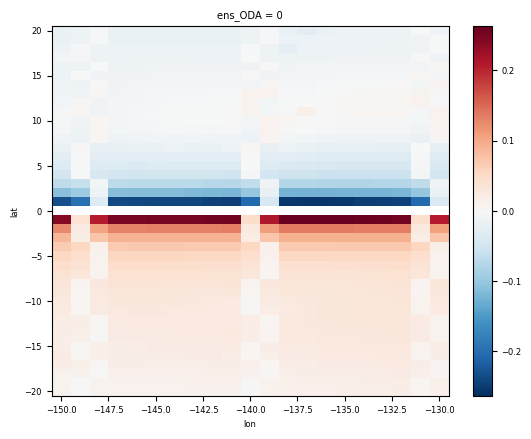

In [436]:
v_g.sel(lon=slice(-150,-130)).sel(lat=slice(-20,20)).isel(ens_ODA=0).mean(dim='time').plot.pcolormesh()

v_g.sel(lon=slice(-142,-138)).sel(lat=slice(-2,2)).mean('time')

# cfg_var_SSH.ODA_ds.sel(lon=slice(-150,-130)).sel(lat=slice(-20,20)).isel(ens_ODA=0).mean(dim='time').plot.pcolormesh()

In [398]:
# normal vectors

# Suppose u_g, v_g: DataArrays with dims (time, lat, lon)
u_mean = cfg_var_UVEL.ODA_ds.mean(dim="time")  # shape (lat, lon)
v_mean = cfg_var_VVEL.ODA_ds.mean(dim="time")  # shape (lat, lon)

speed_mean = np.sqrt(u_mean**2 + v_mean**2)  # shape (lat, lon)

nx = -v_mean / speed_mean  # normal vector x-component
ny =  u_mean / speed_mean  # normal vector y-component

u_anom = cfg_var_UVEL.ODA_ds - u_mean
v_anom = cfg_var_VVEL.ODA_ds - v_mean
u_anom_normal_raw = u_anom * nx + v_anom * ny


# vectors with respect to climatological mean circulation

# Suppose u_g, v_g: DataArrays with dims (time, lat, lon)
u_mean = cfg_var_UVEL.ODA_ds.mean(dim="time")  # shape (lat, lon)
v_mean = cfg_var_VVEL.ODA_ds.mean(dim="time")  # shape (lat, lon)

speed_mean = np.sqrt(u_mean**2 + v_mean**2)  # shape (lat, lon)

nx = v_mean / speed_mean  # normal vector x-component
ny =  u_mean / speed_mean  # normal vector y-component

u_anom = cfg_var_UVEL.ODA_ds - u_mean
v_anom = cfg_var_VVEL.ODA_ds - v_mean
u_anom_clim_raw = u_anom * nx + v_anom * ny


In [397]:
# normal vectors

# Suppose u_g, v_g: DataArrays with dims (time, lat, lon)
u_mean = u_g.mean(dim="time")  # shape (lat, lon)
v_mean = v_g.mean(dim="time")  # shape (lat, lon)

speed_mean = np.sqrt(u_mean**2 + v_mean**2)  # shape (lat, lon)

nx = -v_mean / speed_mean  # normal vector x-component
ny =  u_mean / speed_mean  # normal vector y-component

u_normal = u_g * nx + v_g * ny

u_anom = u_g - u_mean
v_anom = v_g - v_mean
u_anom_normal = u_anom * nx + v_anom * ny

u_anom_normal.mean(dim="time")


# vectors with respect to climatological mean geostrophic circulation

# Suppose u_g, v_g: DataArrays with dims (time, lat, lon)
u_mean = u_g.mean(dim="time")  # shape (lat, lon)
v_mean = v_g.mean(dim="time")  # shape (lat, lon)

speed_mean = np.sqrt(u_mean**2 + v_mean**2)  # shape (lat, lon)

nx = v_mean / speed_mean  # normal vector x-component
ny =  u_mean / speed_mean  # normal vector y-component

u_normal = u_g * nx + v_g * ny

u_anom = u_g - u_mean
v_anom = v_g - v_mean
u_anom_clim = u_anom * nx + v_anom * ny

u_anom_clim.mean(dim="time")

<xarray.DataArray (lat: 180, ens_ODA: 1, lon: 360)> Size: 518kB
array([[[            nan,             nan,             nan, ...,
                     nan,             nan,             nan]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan]],

       ...,

       [[ 1.30309602e-17, -4.36155916e-17, -2.66867056e-17, ...,
          7.85444241e-18, -2.20016380e-17, -1.43235154e-17]],

       [[            nan,             nan, -2.06524087e-17, ...,
                     nan,             nan,             nan]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan]]])
Coordinates:
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 86.0 87.0 88.0 89.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 177.0 178.0 179.0
  * ens_ODA  (ens_ODA) int64 8B 0

In [68]:
cfg_var_TEMP.ODA_path_load(cfg_var_TEMP.var)
cfg_var_TEMP.ODA_ds = xr.open_mfdataset(cfg_var_TEMP.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_TEMP.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'TEMP', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_TEMP.ODA_ds = cfg_var_TEMP.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_TEMP.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_TEMP.ODA_ds.time))
cfg_var_TEMP.ODA_ds = cfg_var_TEMP.ODA_ds.assign_coords(time=new_time)

In [12]:
# BGCs
# reading surface, regrid process for 2 member ODA : around 92 sec
# reading surface for 2 member ODA : around 9 sec


start_time = time.time()

cfg_var_photoC_TOT_zint_100m.ODA_path_load(cfg_var_photoC_TOT_zint_100m.var)
cfg_var_photoC_TOT_zint_100m.ODA_ds = xr.open_mfdataset(cfg_var_photoC_TOT_zint_100m.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_photoC_TOT_zint_100m.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_2d(ds, start_date, end_date, 'photoC_TOT_zint_100m', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_photoC_TOT_zint_100m.ODA_ds = cfg_var_photoC_TOT_zint_100m.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_photoC_TOT_zint_100m.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_photoC_TOT_zint_100m.ODA_ds.time))
cfg_var_photoC_TOT_zint_100m.ODA_ds = cfg_var_photoC_TOT_zint_100m.ODA_ds.assign_coords(time=new_time)


cfg_var_NO3.ODA_path_load(cfg_var_NO3.var)
cfg_var_NO3.ODA_ds = xr.open_mfdataset(cfg_var_NO3.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_NO3.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'NO3', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_NO3.ODA_ds = cfg_var_NO3.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_NO3.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_NO3.ODA_ds.time))
cfg_var_NO3.ODA_ds = cfg_var_NO3.ODA_ds.assign_coords(time=new_time)

cfg_var_Fe.ODA_path_load(cfg_var_Fe.var)
cfg_var_Fe.ODA_ds = xr.open_mfdataset(cfg_var_Fe.ODA_file_list[0][0:1], 
                       chunks={'time': 2}, 
                       combine='nested',
                       concat_dim=[[*cfg_var_Fe.ODA_ensembles[0:1]], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords_surface(ds, start_date, end_date, 'Fe', mask_pacific),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var_Fe.ODA_ds = cfg_var_Fe.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_Fe.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_Fe.ODA_ds.time))
cfg_var_Fe.ODA_ds = cfg_var_Fe.ODA_ds.assign_coords(time=new_time)


end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading BGCs: ' + str(elapsed_time))


elasped time for reading BGCs: 92.30102634429932


elasped time for plotting Vels : 39.77866744995117


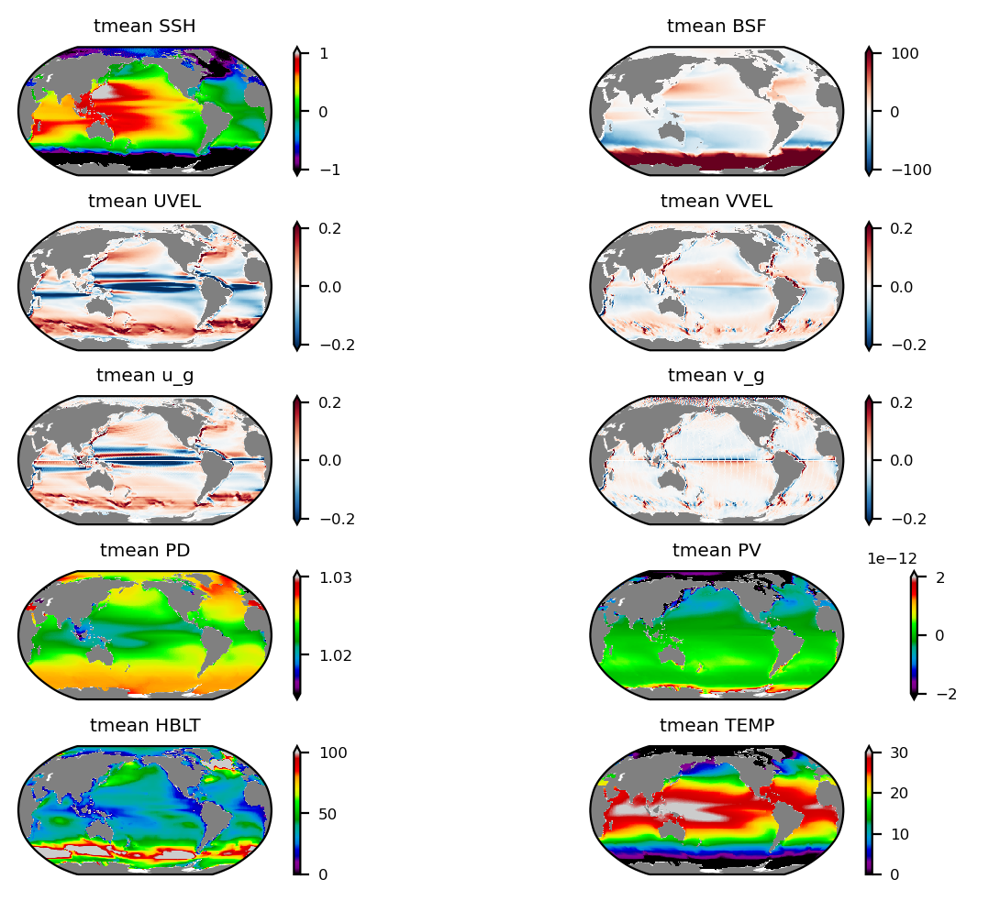

In [399]:
# clim mean

start_time = time.time()

# cmap = 'inferno'
# cmap=cmocean.cm.matter # good appearance
# cmap=cmocean.cm.haline  # good appearance
cmap = plt.get_cmap('nipy_spectral')
cmap2 = plt.get_cmap('RdBu_r')

# cfg_var_UVEL.ODA_ds
# cfg_var_VVEL.ODA_ds
# cfg_var_BSF.ODA_ds
# cfg_var_SSH.ODA_ds
# cfg_var_PD.ODA_ds
# cfg_var_PV.ODA_ds


levels = np.linspace(0,0.8,9)
ticklevels = np.linspace(0,0.8,5)
land_feature = cfeature.LAND.with_scale('110m')

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=5, ncols=2, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

# SSH
data_array=cfg_var_SSH.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='both', vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,0].set_title('tmean ' + cfg_var_SSH.var)
axes[0,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# BSF
data_array=cfg_var_BSF.ODA_ds.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both', vmin=-100, vmax=100,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,1].set_title('tmean ' + cfg_var_BSF.var)
axes[0,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# UVEL
data_array=cfg_var_UVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-0.2, vmax=0.2,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,0].set_title('tmean ' + cfg_var_UVEL.var)
axes[1,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# VVEL
data_array=cfg_var_VVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-0.2, vmax=0.2,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,1].set_title('tmean ' + cfg_var_VVEL.var)
axes[1,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# u_g
data_array=u_g.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-0.2, vmax=0.2,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,0].set_title('tmean ' + 'u_g')
axes[2,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# v_g
data_array=v_g.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-0.2, vmax=0.2,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,1].set_title('tmean ' + 'v_g')
axes[2,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PD
data_array=cfg_var_PD.ODA_ds.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='both',  vmin=1.015, vmax=1.03,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,0].set_title('tmean ' + cfg_var_PD.var)
axes[3,0].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PV
data_array=cfg_var_PV.ODA_ds.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='both',  vmin=-2e-12, vmax=2e-12,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,1].set_title('tmean ' + cfg_var_PV.var)
axes[3,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# HBLT
data_array=cfg_var_HBLT.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max',  vmin=0, vmax=100,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,0].set_title('tmean ' + cfg_var_HBLT.var)
axes[4,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# TEMP
data_array=cfg_var_TEMP.ODA_ds.mean(dim='time').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max',  vmin=0, vmax=30,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,1].set_title('tmean ' + cfg_var_TEMP.var)
axes[4,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

plt.rcParams.update({'font.size': 6})

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plotting Vels : ' + str(elapsed_time))

elasped time for plotting Vels : 0.46401357650756836


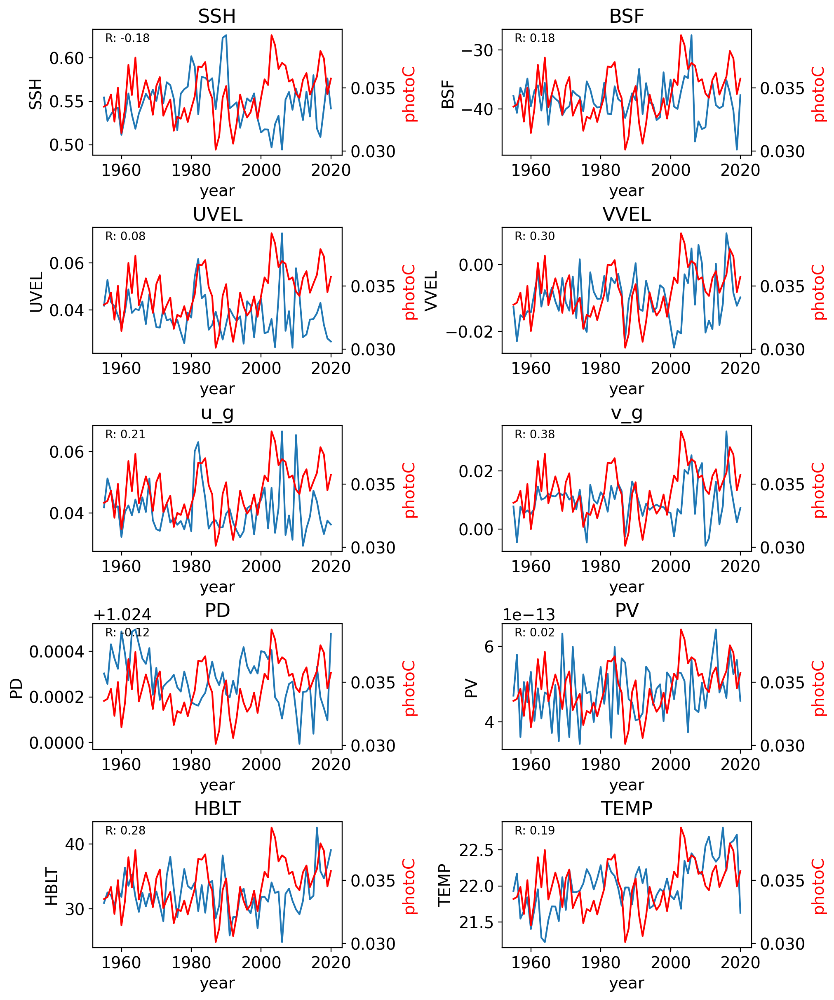

In [110]:
# clim mean

start_time = time.time()

# cmap = 'inferno'
# cmap=cmocean.cm.matter # good appearance
# cmap=cmocean.cm.haline  # good appearance
cmap = plt.get_cmap('nipy_spectral')
cmap2 = plt.get_cmap('RdBu_r')

# cfg_var_UVEL.ODA_ds
# cfg_var_VVEL.ODA_ds
# cfg_var_BSF.ODA_ds
# cfg_var_SSH.ODA_ds
# cfg_var_PD.ODA_ds
# cfg_var_PV.ODA_ds


levels = np.linspace(0,0.8,9)
ticklevels = np.linspace(0,0.8,5)
land_feature = cfeature.LAND.with_scale('110m')

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10, 12),
             dpi=200, facecolor='w', edgecolor='k', constrained_layout=True)

photoC=cfg_var_photoC_TOT_zint_100m.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)

# SSH
data_array=cfg_var_SSH.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)/100
plt1=data_array.plot(ax=axes[0,0])
axes[0,0].set_title(cfg_var_SSH.var)
ax2 = axes[0,0].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[0,0].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[0,0].transAxes,
    fontsize=10, 
)

# BSF
data_array=cfg_var_BSF.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[0,1])
axes[0,1].set_title(cfg_var_BSF.var)
ax2 = axes[0,1].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[0,1].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[0,1].transAxes,
    fontsize=10, 
)

# UVEL
data_array=cfg_var_UVEL.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)/100
plt1=data_array.plot(ax=axes[1,0])
axes[1,0].set_title(cfg_var_UVEL.var)
ax2 = axes[1,0].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[1,0].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[1,0].transAxes,
    fontsize=10, 
)

# VVEL
data_array=cfg_var_VVEL.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)/100
plt1=data_array.plot(ax=axes[1,1])
axes[1,1].set_title(cfg_var_VVEL.var)
ax2 = axes[1,1].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[1,1].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[1,1].transAxes,
    fontsize=10, 
)

# u_g
data_array=u_g.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[2,0])
axes[2,0].set_title('u_g')
ax2 = axes[2,0].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[2,0].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[2,0].transAxes,
    fontsize=10, 
)

# v_g
data_array=v_g.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[2,1])
axes[2,1].set_title('v_g')
ax2 = axes[2,1].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[2,1].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[2,1].transAxes,
    fontsize=10, 
)

# PD
data_array=cfg_var_PD.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[3,0])
axes[3,0].set_title(cfg_var_PD.var)
ax2 = axes[3,0].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[3,0].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[3,0].transAxes,
    fontsize=10, 
)

# PV
data_array=cfg_var_PV.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[3,1])
axes[3,1].set_title(cfg_var_PV.var)
ax2 = axes[3,1].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[3,1].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[3,1].transAxes,
    fontsize=10, 
)

# HBLT
data_array=cfg_var_HBLT.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)/100
plt1=data_array.plot(ax=axes[4,0])
axes[4,0].set_title(cfg_var_HBLT.var)
ax2 = axes[4,0].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[4,0].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[4,0].transAxes,
    fontsize=10, 
)

# TEMP
data_array=cfg_var_TEMP.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)
plt1=data_array.plot(ax=axes[4,1])
axes[4,1].set_title(cfg_var_TEMP.var)
ax2 = axes[4,1].twinx()
line2 = photoC.plot(color="red")
ax2.set_ylabel("photoC", color="red")
ax2.set_title(" ")
corrvals=xr.corr(data_array, photoC, dim='year').compute()
corr_val = corrvals.item()  # Convert 0D DataArray -> Python float
axes[4,1].text(
    0.05, 0.9,            # x,y position in [0..1] Axes coordinates
    f"R: {corr_val:.2f}", # e.g. R: 0.85
    transform=axes[4,1].transAxes,
    fontsize=10, 
)

plt.rcParams.update({'font.size': 14})

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plotting Vels : ' + str(elapsed_time))

In [130]:
# Assume NO3 is your DataArray with dims (time, lat, lon, etc.)
NO3 = cfg_var_NO3.ODA_ds

# Calculate partial derivatives in degrees
NO3_dlon = NO3.mean(dim='time').isel(ens_ODA=0).differentiate(coord="lon")  # dNO3/d(lon)
NO3_dlat = NO3.mean(dim='time').isel(ens_ODA=0).differentiate(coord="lat")  # dNO3/d(lat)

R = 6371_000.0
deg2rad = np.pi / 180.0

# Convert derivatives from "per degree" to "per meter"
#   lat, lon from NO3
NO3_dx = NO3_dlon / (R * np.cos(np.deg2rad(NO3.lat)) * deg2rad)
NO3_dy = NO3_dlat / (R * deg2rad)

# Build mask:
NO3_grd_mask = xr.where(NO3_dx > NO3_dy, 1, 2)

# Suppose you want `corr_critical_g` to equal `corr_photoC_u_g`
# by default, but wherever NO3_grd_mask == 2, use `corr_photoC_v_g`.
# One-liner with xr.where:
corr_critical_g_NO3 = xr.where(NO3_grd_mask == 2, corr_photoC_v_g, corr_photoC_u_g)

# Now `corr_critical_g` is a DataArray:
#   - same shape as your correlation arrays
#   - wherever mask==2, it’s `corr_photoC_v_g`, else `corr_photoC_u_g`.

In [131]:
# Assume Fe is your DataArray with dims (time, lat, lon, etc.)
Fe = cfg_var_Fe.ODA_ds

# Calculate partial derivatives in degrees
Fe_dlon = Fe.mean(dim='time').isel(ens_ODA=0).differentiate(coord="lon")  # dFe/d(lon)
Fe_dlat = Fe.mean(dim='time').isel(ens_ODA=0).differentiate(coord="lat")  # dFe/d(lat)

R = 6371_000.0
deg2rad = np.pi / 180.0

# Convert derivatives from "per degree" to "per meter"
#   lat, lon from Fe
Fe_dx = Fe_dlon / (R * np.cos(np.deg2rad(Fe.lat)) * deg2rad)
Fe_dy = Fe_dlat / (R * deg2rad)

# Build mask:
Fe_grd_mask = xr.where(Fe_dx > Fe_dy, 1, 2)

# Suppose you want `corr_critical_g` to equal `corr_photoC_u_g`
# by default, but wherever Fe_grd_mask == 2, use `corr_photoC_v_g`.
# One-liner with xr.where:
corr_critical_g_Fe = xr.where(Fe_grd_mask == 2, corr_photoC_v_g, corr_photoC_u_g)

# Now `corr_critical_g` is a DataArray:
#   - same shape as your correlation arrays
#   - wherever mask==2, it’s `corr_photoC_v_g`, else `corr_photoC_u_g`.

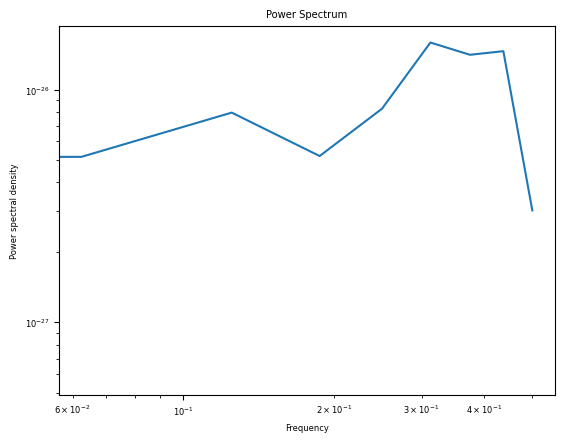

Low-frequency power: 1.0002049221171597e-27
High-frequency power: 3.1488679664231745e-27
Fraction of variance at low frequencies = 0.24
Peak period = 3.20 years


In [148]:
# example psd and judgement of low-frequency-dominant-flow

from scipy.signal import welch

# Suppose `ts` is a 1D NumPy array of your time-series data,
# sampled at a known rate (e.g. 1 sample / month or 1 sample / day).
sampling_rate = 1.0  # e.g., 1 per year, or 12 per year if monthly

# ts=photoC
ts=cfg_var_PV.ODA_ds.sel(lon=60, method='nearest').sel(lat=-30, method='nearest').groupby("time.year").mean().isel(ens_ODA=0)


freqs, psd = welch(ts, fs=sampling_rate, nperseg=len(ts)//4)

plt.figure()
plt.loglog(freqs, psd)
plt.xlabel("Frequency")
plt.ylabel("Power spectral density")
plt.title("Power Spectrum")
plt.show()

cutoff = 0.2  # for example, 0.5 cyc/yr if you define a 5-year threshold
low_mask = freqs < cutoff
high_mask = freqs >= cutoff

low_power = np.trapz(psd[low_mask], freqs[low_mask])
high_power = np.trapz(psd[high_mask], freqs[high_mask])

print("Low-frequency power:", low_power)
print("High-frequency power:", high_power)

# If ratio is near 1.0, the time series is strongly low-frequency-dominant. If it’s near 0, then it’s high-frequency-dominant.
ratio = low_power / (low_power + high_power)
print(f"Fraction of variance at low frequencies = {ratio:.2f}")

peak_index = np.argmax(psd)
f_peak = freqs[peak_index]
T_peak = 1.0 / f_peak  # e.g. in years if freq is cyc/yr
print(f"Peak period = {T_peak:.2f} years")

In [199]:
1/psd_da.freq

<xarray.DataArray 'freq' (freq: 9)> Size: 72B
array([        inf, 16.        ,  8.        ,  5.33333333,  4.        ,
        3.2       ,  2.66666667,  2.28571429,  2.        ])
Coordinates:
    ens_ODA  int64 8B 0
  * freq     (freq) float64 72B 0.0 0.0625 0.125 0.1875 ... 0.375 0.4375 0.5

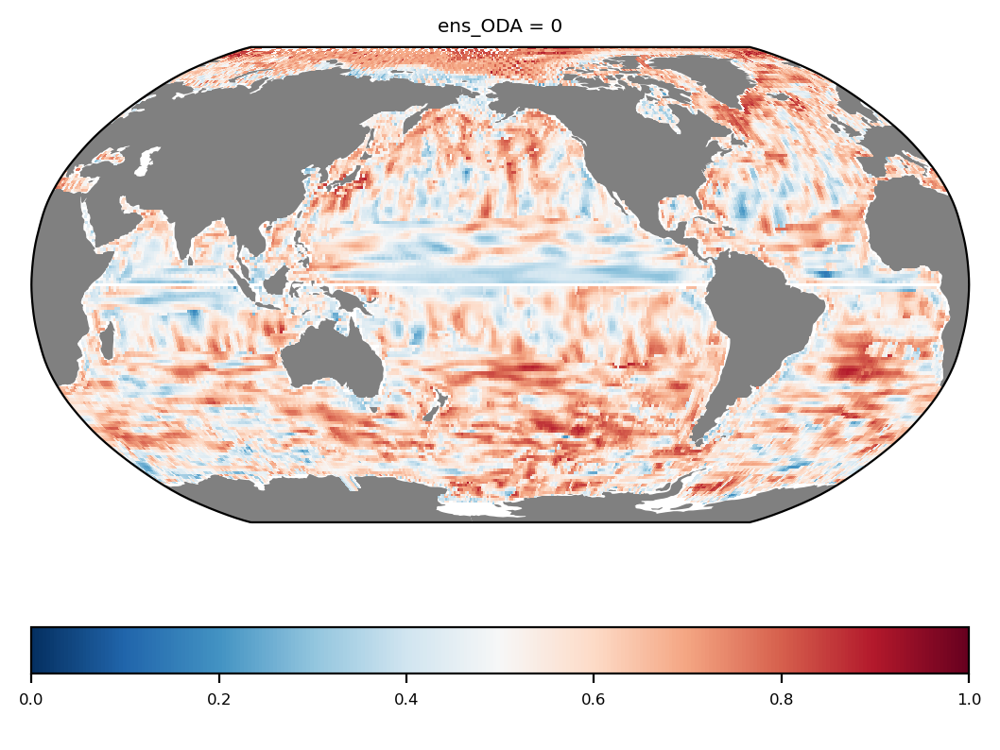

In [217]:
from scipy.signal import welch

def welch_1d(data_1d, fs=1.0, nperseg=None):
    """
    data_1d: 1D NumPy array of length N (the time series).
    fs: sampling frequency in cyc/year (or cyc/month, etc.).
    nperseg: segment length for Welch
    Returns the 1D power spectral density (psd) ignoring freq array.
    """
    freqs, pxx = welch(data_1d, fs=fs, nperseg=nperseg)
    return pxx

def compute_2d_welch(ts, fs=1.0):
    """
    ts: xarray DataArray with dims (year, lat, lon)
    fs: sampling rate, e.g. 1.0 cyc/year
    Returns a new DataArray with dims (freq, lat, lon) 
    storing the PSD at each lat-lon point.
    """
    # 1) pick nperseg
    ntime = ts.sizes["year"]
    nperseg = ntime // 4  # or pick a different chunk size
    
    # 2) apply_ufunc to do welch_1d over 'year'
    psd = xr.apply_ufunc(
        welch_1d,
        ts,  
        input_core_dims=[["year"]],
        output_core_dims=[["freq"]],
        output_sizes={"freq": (nperseg // 2) + 1},
        kwargs={"fs": fs, "nperseg": nperseg},
        vectorize=True,
        dask="parallelized",
        output_dtypes=[float],
    )

    # 3) Determine 'freq' by calling welch on a dummy 1D array
    dummy = np.ones(ntime)
    freqs, _ = welch(dummy, fs=fs, nperseg=nperseg)
    psd = psd.assign_coords(freq=("freq", freqs))

    return psd


# --- EXAMPLE USAGE ---

# Suppose ts is (year, lat, lon)
# e.g.: ts = some_data.groupby("time.year").mean("time")
# ts = cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0)
ts1 = u_g.groupby("time.year").mean().isel(ens_ODA=0)
ts2 = v_g.groupby("time.year").mean().isel(ens_ODA=0)
ts = xr.where(NO3_grd_mask == 2, ts2, ts1)

psd_da = compute_2d_welch(ts, fs=1.0)  # => dims (freq, lat, lon)

cutoff = 0.2  # 0.33 cyc/year
# We'll separate "low freq" (freq < 0.2) and "high freq" (freq >= 0.2)

# 1) low_power: integrate psd over freq < cutoff
low_psd = psd_da.where(psd_da.freq < cutoff)  # mask out freq >= cutoff
# low_power = low_psd.integrate(coord="freq")   # xarray integration over 'freq'
low_power = low_psd.fillna(0).integrate(coord="freq")
# Result shape => (lat, lon)

# 2) high_power: integrate psd over freq >= cutoff
high_psd = psd_da.where(psd_da.freq >= cutoff)
# high_power = high_psd.integrate(coord="freq") # shape => (lat, lon)
high_power = high_psd.fillna(0).integrate(coord="freq")

# 3) ratio = low_power / (low_power + high_power)
ratio_lq = low_power / (low_power + high_power)   # shape => (lat, lon)


# 1) Replace NaN with -∞ along freq:
psd_filled = psd_da.fillna(-np.inf)

# 2) Argmax works now, since -∞ is always “less” than any real number:
peak_index = psd_filled.argmax(dim="freq")   # shape => (lat, lon)

# 3) Identify which cells were *entirely* NaN across freq:
#    i.e. their max is still -∞ even after fill, so the real “peak” is invalid.
max_val = psd_filled.max(dim="freq")         # shape => (lat, lon)
mask_all_nan = (max_val == -np.inf)

# after computing peak_index, we have floats (some NaN)
# step 1) fill NaN with 0 or some valid freq index
peak_index_int = peak_index.fillna(0).astype(int)

# step 2) if you want to mask out “all-NaN” cells, do so:
#   e.g. mask_all_nan is True where the entire freq slice was NaN
peak_index_int = peak_index_int.where(~mask_all_nan, other=0)

# step 3) now peak_index_int is integer type with no NaN => use isel()
f_peak = psd_da.freq.isel(freq=peak_index_int)

# If you also want T_peak
T_peak = (1.0 / f_peak).where(~mask_all_nan)  # or mask out the invalid cells


land_feature = cfeature.LAND.with_scale('110m')
cmap = plt.get_cmap('RdBu_r')
projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=1, ncols=1,
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)
plt1=ratio_lq.plot.pcolormesh(x='lon', y='lat', ax=axes, transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes.add_feature(land_feature, facecolor='gray', edgecolor='none')

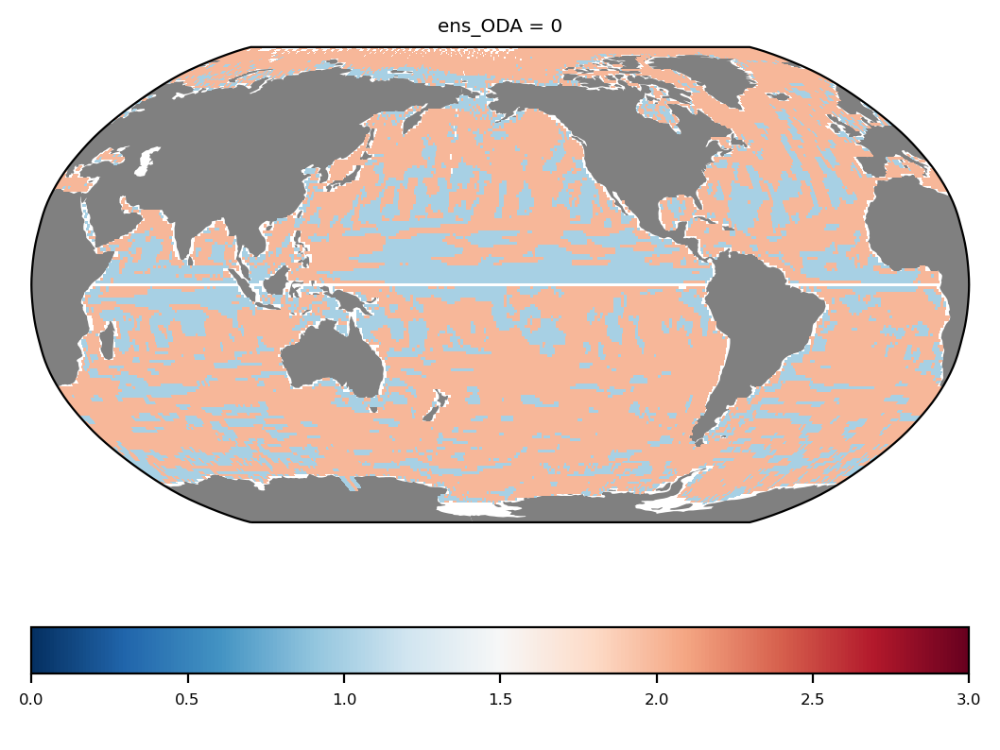

In [218]:
low_freq_mask = xr.where(
    ratio_lq.isnull(), 
    np.nan,                    # if ratio_lq is NaN, then mask is NaN
    xr.where(ratio_lq > 0.5, 2, 1)
)

land_feature = cfeature.LAND.with_scale('110m')
cmap = plt.get_cmap('RdBu_r')
projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=1, ncols=1,
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)
plt1=low_freq_mask.plot.pcolormesh(x='lon', y='lat', ax=axes, transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, vmin=0, vmax=3,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes.add_feature(land_feature, facecolor='gray', edgecolor='none')


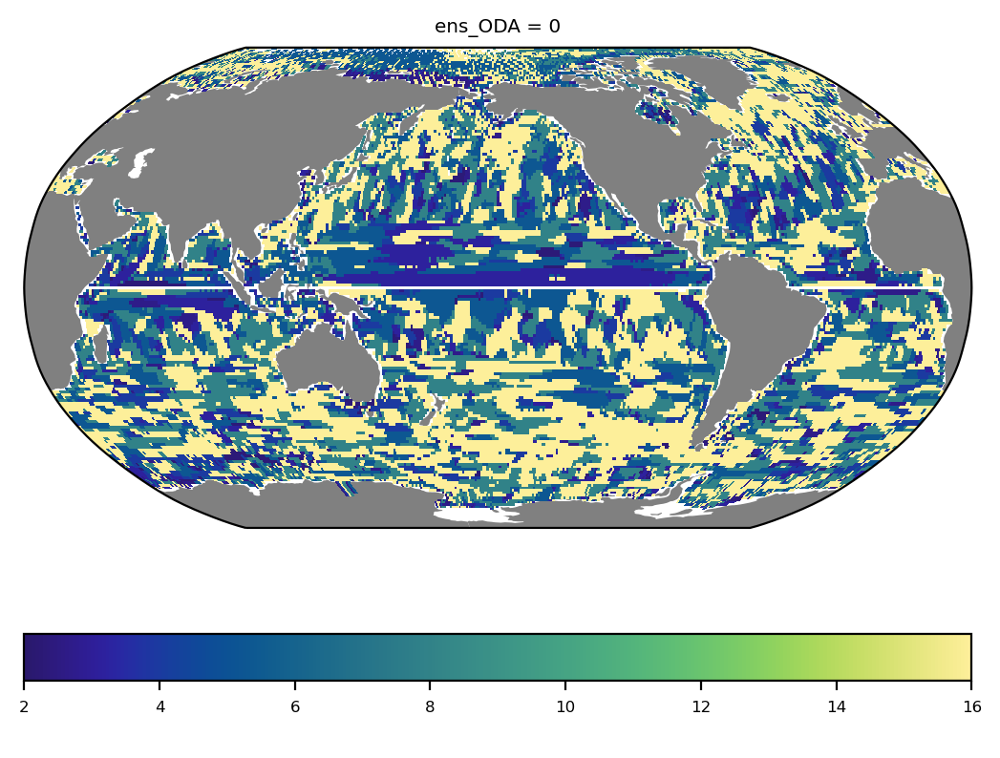

In [221]:

land_feature = cfeature.LAND.with_scale('110m')
cmap=cmocean.cm.haline  # good appearance
projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=1, ncols=1,
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)
plt1=T_peak.plot.pcolormesh(x='lon', y='lat', ax=axes, transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, vmin=2, vmax=16,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes.add_feature(land_feature, facecolor='gray', edgecolor='none')


elasped time for plotting Vels : 38.2980682849884


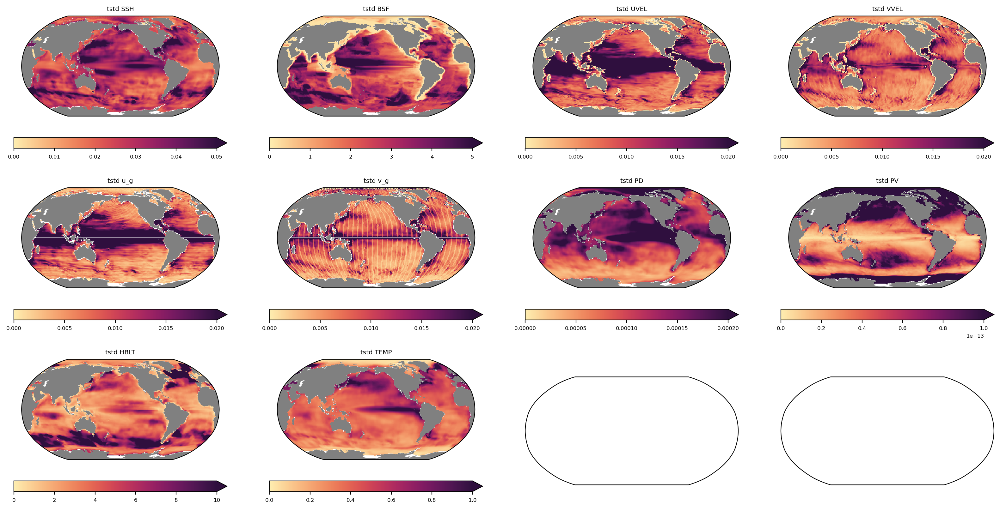

In [141]:
# clim  std

start_time = time.time()

# cmap = 'inferno'
# cmap=cmocean.cm.matter # good appearance
# cmap=cmocean.cm.haline  # good appearance
# cmap = plt.get_cmap('nipy_spectral')
# cmap2 = plt.get_cmap('RdBu_r')

cmap = cmocean.cm.matter 
cmap2 = cmocean.cm.matter 


levels = np.linspace(0,0.8,9)
ticklevels = np.linspace(0,0.8,5)
land_feature = cfeature.LAND.with_scale('110m')

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 10),
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)



# SSH
data_array=cfg_var_SSH.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max', vmin=0, vmax=0.05,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[0,0].set_title('tstd ' + cfg_var_SSH.var)
axes[0,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# BSF
data_array=cfg_var_BSF.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max', vmin=0, vmax=5,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[0,1].set_title('tstd ' + cfg_var_BSF.var)
axes[0,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# UVEL
data_array=cfg_var_UVEL.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,2], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max', vmin=0, vmax=0.02,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[0,2].set_title('tstd ' + cfg_var_UVEL.var)
axes[0,2].add_feature(land_feature, facecolor='gray', edgecolor='none')

# VVEL
data_array=cfg_var_VVEL.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,3], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max', vmin=0, vmax=0.02,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[0,3].set_title('tstd ' + cfg_var_VVEL.var)
axes[0,3].add_feature(land_feature, facecolor='gray', edgecolor='none')

# u_g
data_array=u_g.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max', vmin=0, vmax=0.02,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[1,0].set_title('tstd ' + 'u_g')
axes[1,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# v_g
data_array=v_g.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max', vmin=0, vmax=0.02,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[1,1].set_title('tstd ' + 'v_g')
axes[1,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PD
data_array=cfg_var_PD.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,2], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max', vmin=0, vmax=0.0002,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[1,2].set_title('tstd ' + cfg_var_PD.var)
axes[1,2].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PV
data_array=cfg_var_PV.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,3], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max', vmin=0, vmax=1e-13,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[1,3].set_title('tstd ' + cfg_var_PV.var)
axes[1,3].add_feature(land_feature, facecolor='gray', edgecolor='none')

# HBLT
data_array=cfg_var_HBLT.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)/100
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max',  vmin=0, vmax=10,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[2,0].set_title('tstd ' + cfg_var_HBLT.var)
axes[2,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# TEMP
data_array=cfg_var_TEMP.ODA_ds.groupby("time.year").mean().std(dim='year').isel(ens_ODA=0)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap, add_colorbar=True, extend='max',  vmin=0, vmax=1,
                                cbar_kwargs={'orientation':'horizontal',"label": " ", 'spacing': 'proportional'})

axes[2,1].set_title('tstd ' + cfg_var_TEMP.var)
axes[2,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

plt.rcParams.update({'font.size': 10})

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plotting Vels : ' + str(elapsed_time))

In [77]:
# calculation of corrs: photoC
start_time = time.time()

corr_photoC_SSH=xr.corr(cfg_var_SSH.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_BSF=xr.corr(cfg_var_BSF.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_UVEL=xr.corr(cfg_var_UVEL.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_VVEL=xr.corr(cfg_var_VVEL.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_u_g=xr.corr(u_g.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_v_g=xr.corr(v_g.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_PD=xr.corr(cfg_var_PD.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_PV=xr.corr(cfg_var_PV.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_HBLT=xr.corr(cfg_var_HBLT.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_TEMP=xr.corr(cfg_var_TEMP.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_speed_g=xr.corr(speed_g.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_u_anom_normal=xr.corr(u_anom_normal.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_u_anom_clim=xr.corr(u_anom_clim.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
corr_photoC_u_anom_clim_raw=xr.corr(u_anom_clim_raw.groupby("time.year").mean().isel(ens_ODA=0), 
                     cfg_var_photoC_TOT_zint_100m.ODA_ds.groupby("time.year").mean().isel(ens_ODA=0), dim='year').compute()
end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for getting corrs : ' + str(elapsed_time))

In [133]:
cfg_var=CESM2_config()
cfg_var.year_s=1960
cfg_var.year_e=2020
cfg_var.setvar('photoC_TOT_zint_100m')

exceptcv=['time','lon','lat','lev', 'TLONG', 'TLAT', 'z_w', cfg_var.var]
def process_coords(ds, sd, ed, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        return ds
    else:
        return ds.set_coords(coord_vars)


start_date = cftime.DatetimeNoLeap(cfg_var.year_s, 2, 1)
end_date = cftime.DatetimeNoLeap(cfg_var.year_e+1, 1, 1)



cfg_var.LE_path_load(cfg_var.var)
cfg_var.LE_ds = xr.open_mfdataset(cfg_var.LE_file_list[0], 
                       chunks={'time': 12}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)

cfg_var.LE_ds = cfg_var.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.LE_ds.time))
cfg_var.LE_ds = cfg_var.LE_ds.assign_coords(time=new_time)




cfg_var.ODA_path_load(cfg_var.var)
ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][0:10],
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[0:10]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

ODA_ds2 = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

# en4.2 -> until 2021; projdv7.3 -> until 2020; need to be read separately
ODA_ds_a = []
ODA_ds_a.append(ODA_ds)
ODA_ds_xr = xr.concat(ODA_ds_a, dim='time')
ODA_ds_xr = ODA_ds_xr.expand_dims({'ens': range(10)})

ODA_ds2_a = []
ODA_ds2_a.append(ODA_ds2)
ODA_ds2_xr = xr.concat(ODA_ds2_a, dim='time')
ODA_ds2_xr = ODA_ds2_xr.expand_dims({'ens': range(10, 20)})

cfg_var.ODA_ds = []
cfg_var.ODA_ds.append(ODA_ds_xr)
cfg_var.ODA_ds.append(ODA_ds2_xr)
cfg_var.ODA_ds = xr.concat(cfg_var.ODA_ds, dim='ens')
cfg_var.ODA_ds = cfg_var.ODA_ds.reindex(ens=list(range(1, 20+1)))
cfg_var.ODA_ds = cfg_var.ODA_ds.sortby('time')

cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)
cfg_var.ODA_ds = cfg_var.ODA_ds.drop('ens')
cfg_var.ODA_ds=cfg_var.ODA_ds.mean(dim='ens')




cfg_var.OBS_path_load(cfg_var.var)
cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
                       chunks={'time': 12}, 
                       parallel=True,
                       decode_cf=True, 
                       decode_times=True,)
cfg_var.OBS_ds = cfg_var.OBS_ds.rename({cfg_var.OBS_var: cfg_var.var})

if cfg_var.var=='SSH':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[396:732])
elif cfg_var.var=='photoC_TOT_zint_100m':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[456:732])
cfg_var.OBS_ds.time

# global mean removal for SSH
if cfg_var.var=='SSH':
    lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['SSH'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']


# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var.OBS_ds['photoC_TOT_zint_100m'].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var.OBS_ds['mask_80_percent'] = mask
cfg_var.OBS_ds['mask_80_percent'].compute()






obs_non_nan_times = cfg_var.OBS_ds[cfg_var.var].notnull().any(dim=['nlat', 'nlon'])
obs_non_nan_times = obs_non_nan_times.compute()
non_nan_time_coords = cfg_var.OBS_ds.time.where(obs_non_nan_times, drop=True)
oda_filtered = cfg_var.ODA_ds.sel(time=non_nan_time_coords)
le_filtered = cfg_var.LE_ds.sel(time=non_nan_time_coords)

oda_annual_mean = oda_filtered.groupby('time.year').mean(dim='time', skipna=True)
le_annual_mean = le_filtered.groupby('time.year').mean(dim='time', skipna=True)
obs_annual_mean = cfg_var.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)

ref_time=cfg_var.ODA_ds.time.groupby('time.year').mean(dim='time')

le_annual_mean['enm']=le_annual_mean[cfg_var.var].mean(dim='ens_LE')
oda_annual_mean['diff_le']=oda_annual_mean[cfg_var.var] - le_annual_mean.enm

corr_ODA_diff = xr.corr(oda_annual_mean.diff_le, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()


# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

# t_stat_HCST, p_values_HCST = ttest_1samp(corr_HCST, 0, axis=0)
# ds_HCST = corr_HCST.mean(dim='ens_HCST').where(p_values_HCST < alpha)
# threshold = 0
# mask_HCST = ds_HCST > threshold 

# grid_spacing_HCST = 10
# mask_HCST_land = mask_HCST & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# HCST_valid_indices = np.where(mask_HCST_land)
# HCST_coarse_valid_indices = (HCST_valid_indices[0][::grid_spacing_HCST], HCST_valid_indices[1][::grid_spacing_HCST])

# HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
# mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# not_valid_indices = np.where(mask_not_ODA_land)
# coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])

NameError: name 'mask_land' is not defined

<xarray.DataArray (nlat: 384, nlon: 320)> Size: 123kB
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Dimensions without coordinates: nlat, nlon

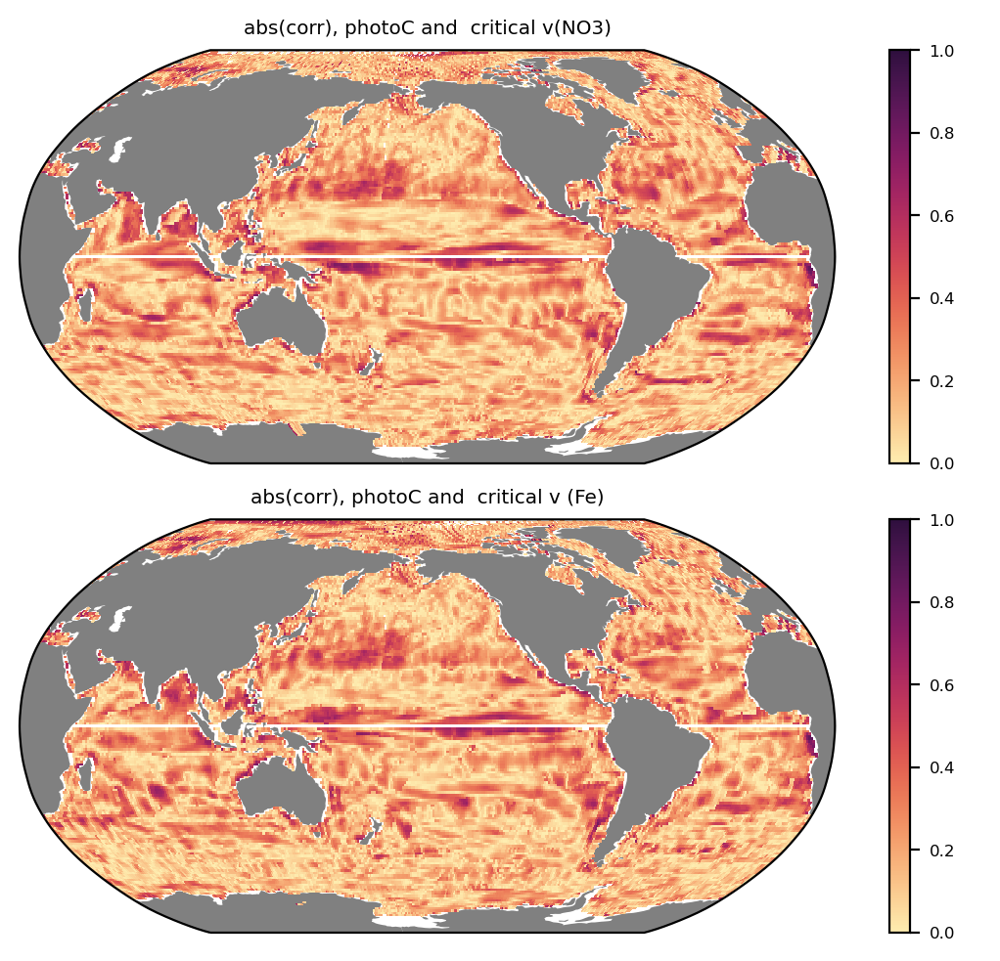

In [437]:
projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_critical_g_NO3)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
axes[0].set_title('abs(corr), photoC and  ' + 'critical v(NO3)')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# contour4 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[1, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well


data_array = np.abs(corr_critical_g_Fe)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'critical v (Fe)')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')

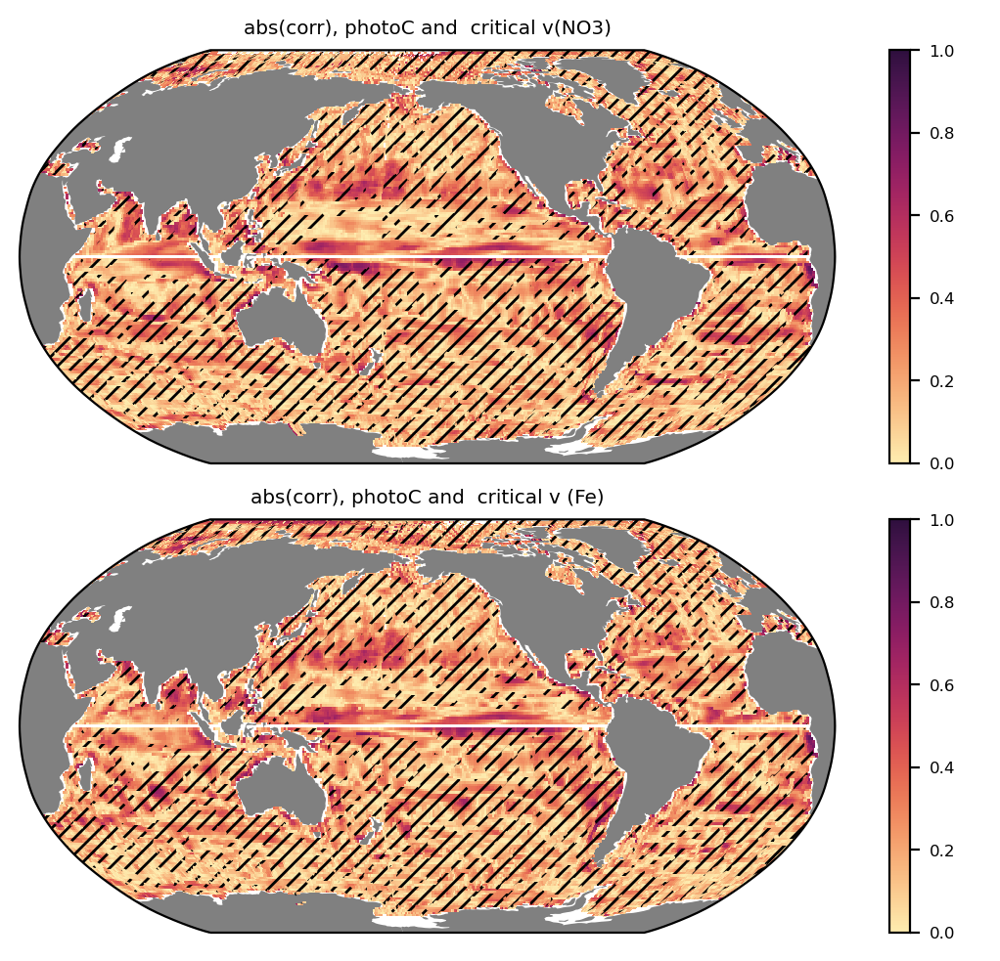

In [222]:
projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_critical_g_NO3)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
contour1 = ratio_lq.where(ratio_lq > 0.5, np.nan).plot.contourf(x='lon', y='lat', 
                    ax=axes[0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well

axes[0].set_title('abs(corr), photoC and  ' + 'critical v(NO3)')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_critical_g_Fe)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
contour1 = ratio_lq.where(ratio_lq > 0.5, np.nan).plot.contourf(x='lon', y='lat', 
                    ax=axes[1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well

axes[1].set_title('abs(corr), photoC and  ' + 'critical v (Fe)')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')

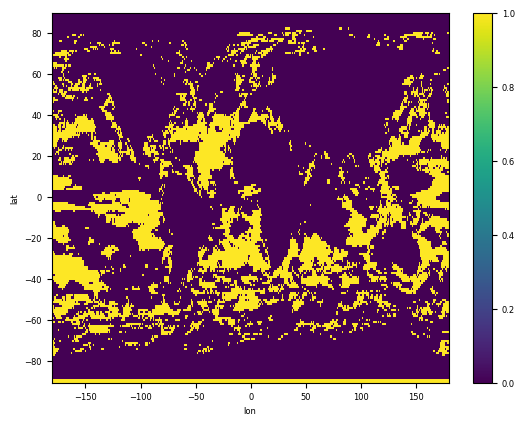

In [231]:
mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
mask_ODA_rgd.plot.pcolormesh()

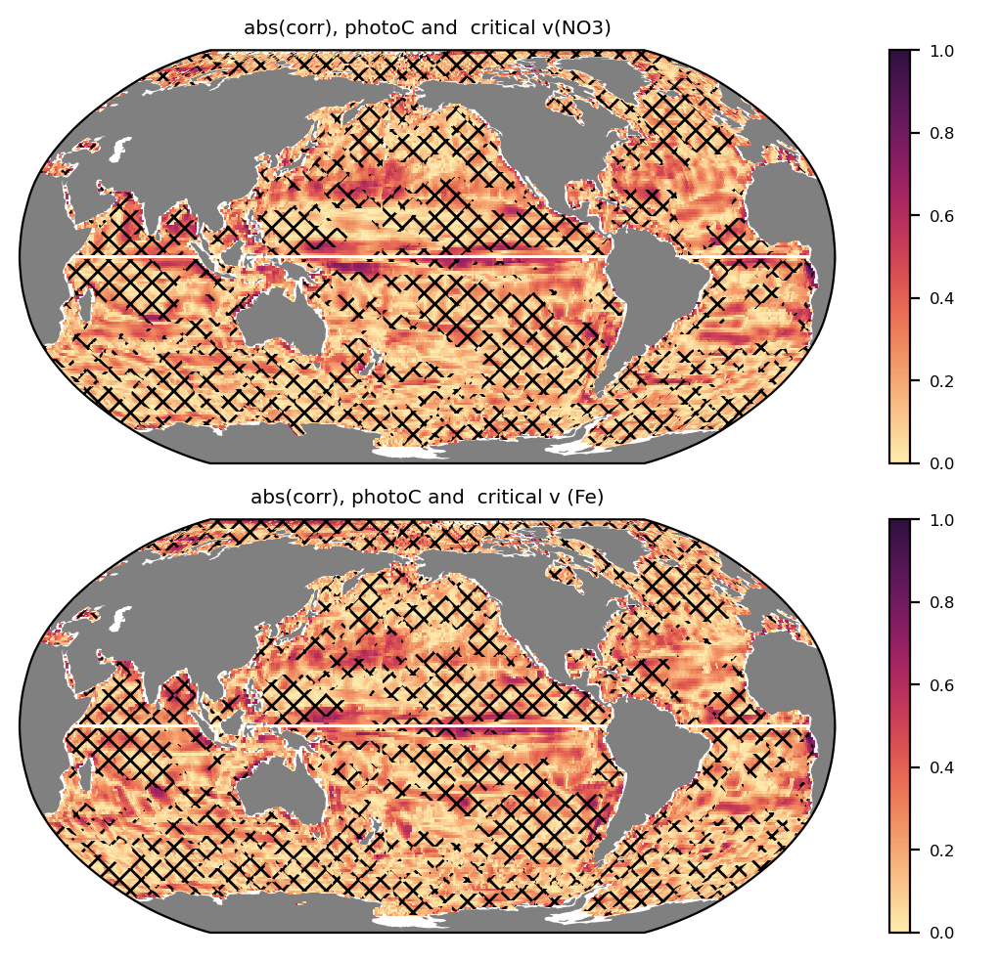

In [233]:

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_critical_g_NO3)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
# contour1 = HCST_data_array_masked2.where(HCST_data_array_masked2 > 0, np.nan).plot.contourf(x='lon', y='lat', 
#                     ax=axes[0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
hatch1 = data_array.where(~mask_ODA_rgd, np.nan).plot.contourf(x='lon', y='lat', 
                    ax=axes[0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well



axes[0].set_title('abs(corr), photoC and  ' + 'critical v(NO3)')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')


data_array = np.abs(corr_critical_g_Fe)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
# contour1 = HCST_data_array_masked2.where(HCST_data_array_masked2 > 0, np.nan).plot.contourf(x='lon', y='lat', 
#                     ax=axes[1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
hatch1 = data_array.where(~mask_ODA_rgd, np.nan).plot.contourf(x='lon', y='lat',  
                    ax=axes[1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well


axes[1].set_title('abs(corr), photoC and  ' + 'critical v (Fe)')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')

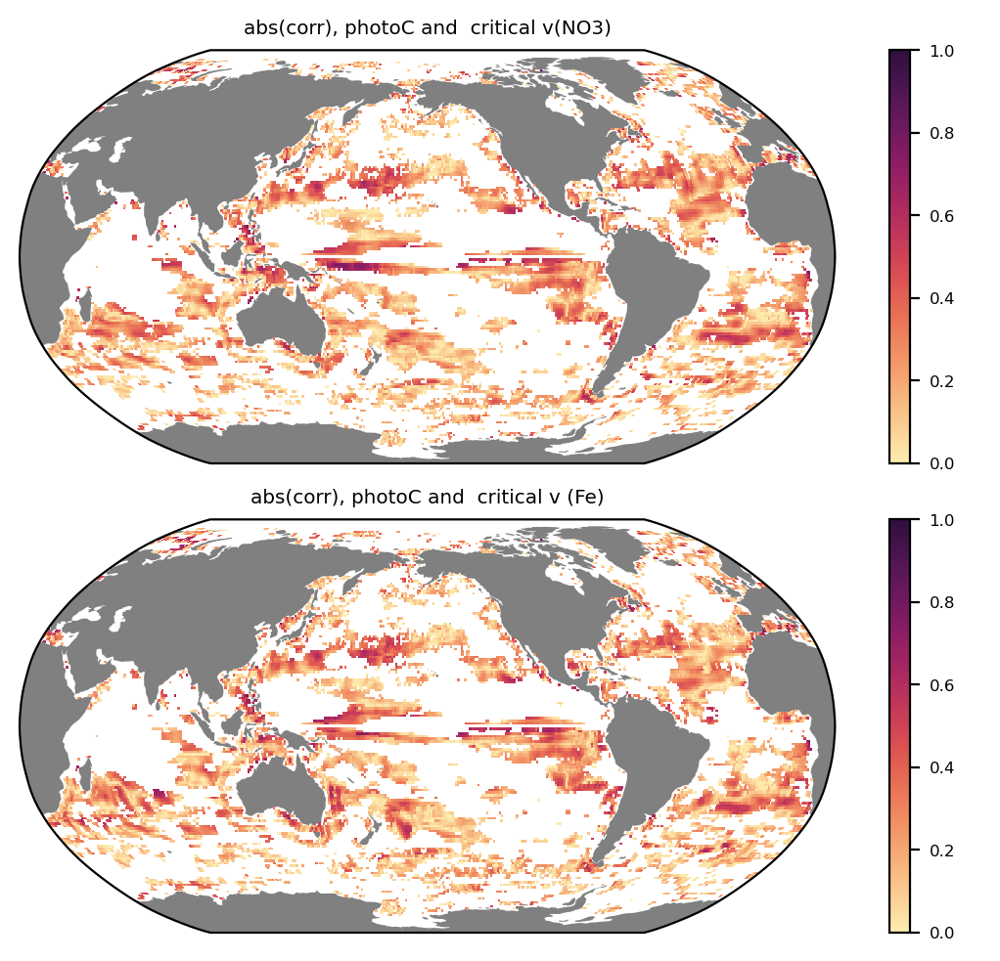

In [237]:
# critical vel

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_critical_g_NO3)
# plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
# hatch1 = data_array.where(~mask_ODA_rgd, np.nan).plot.contourf(x='lon', y='lat', 
#                     ax=axes[0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well


axes[0].set_title('abs(corr), photoC and  ' + 'critical v(NO3)')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')


data_array = np.abs(corr_critical_g_Fe)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})
# hatch1 = data_array.where(~mask_ODA_rgd, np.nan).plot.contourf(x='lon', y='lat',  
#                     ax=axes[1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well


axes[1].set_title('abs(corr), photoC and  ' + 'critical v (Fe)')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')

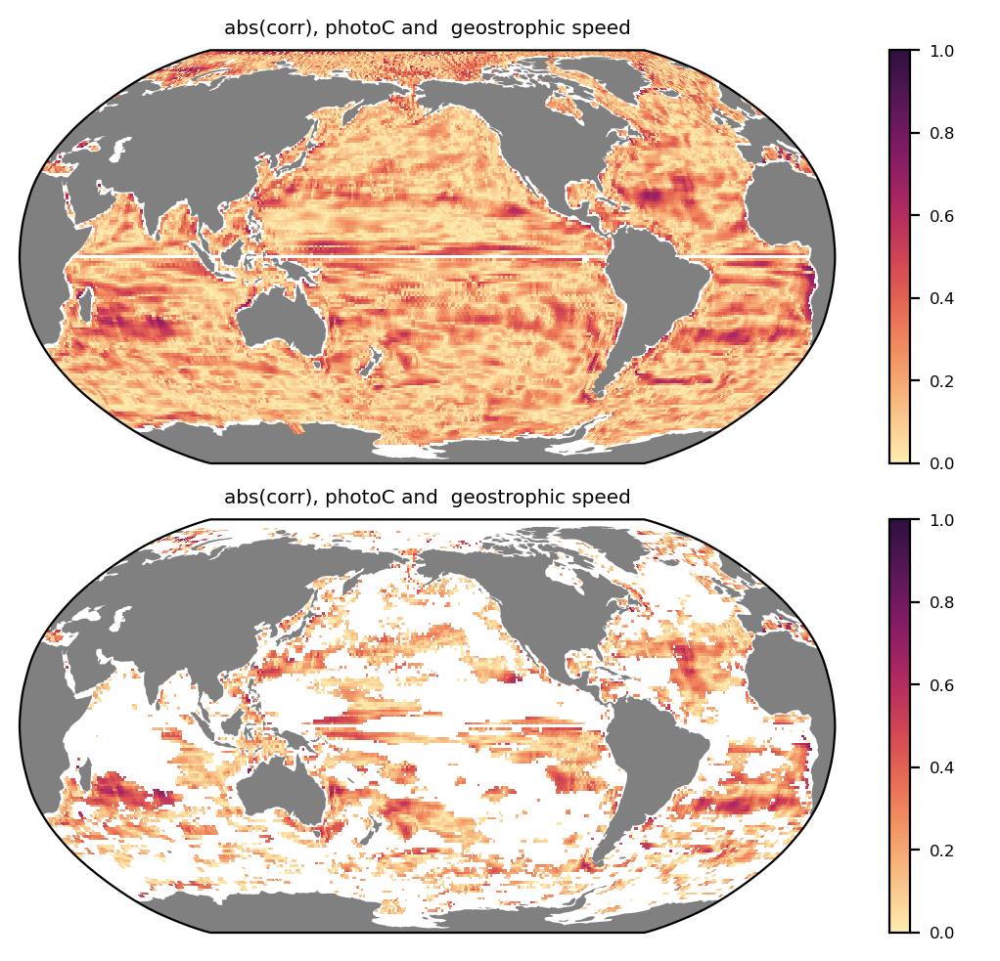

In [438]:
# corr between NPP and geostrophic current mean speed

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_photoC_speed_g)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'geostrophic speed')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_speed_g)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'geostrophic speed')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')



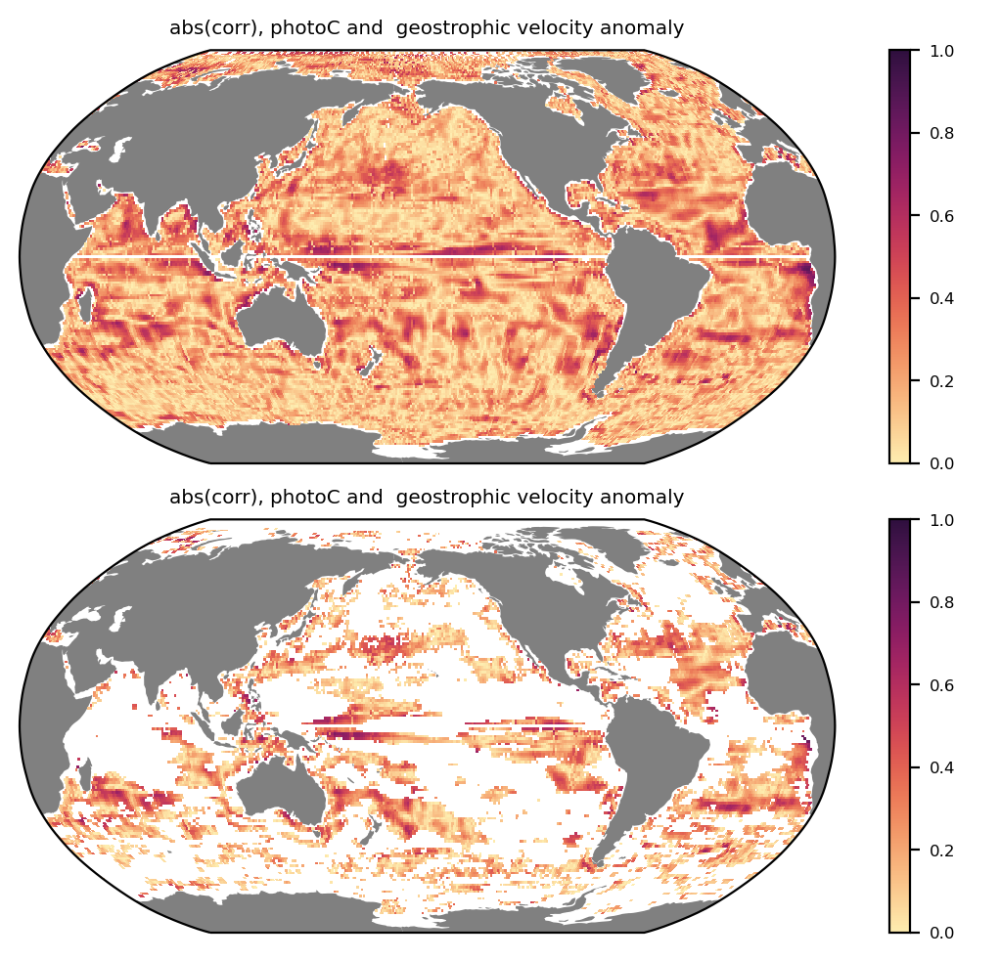

In [446]:
# corr between NPP and normal component to the climatological mean geostrophic current

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_photoC_u_anom_clim)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'geostrophic velocity anomaly')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_u_anom_clim)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'geostrophic velocity anomaly')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')




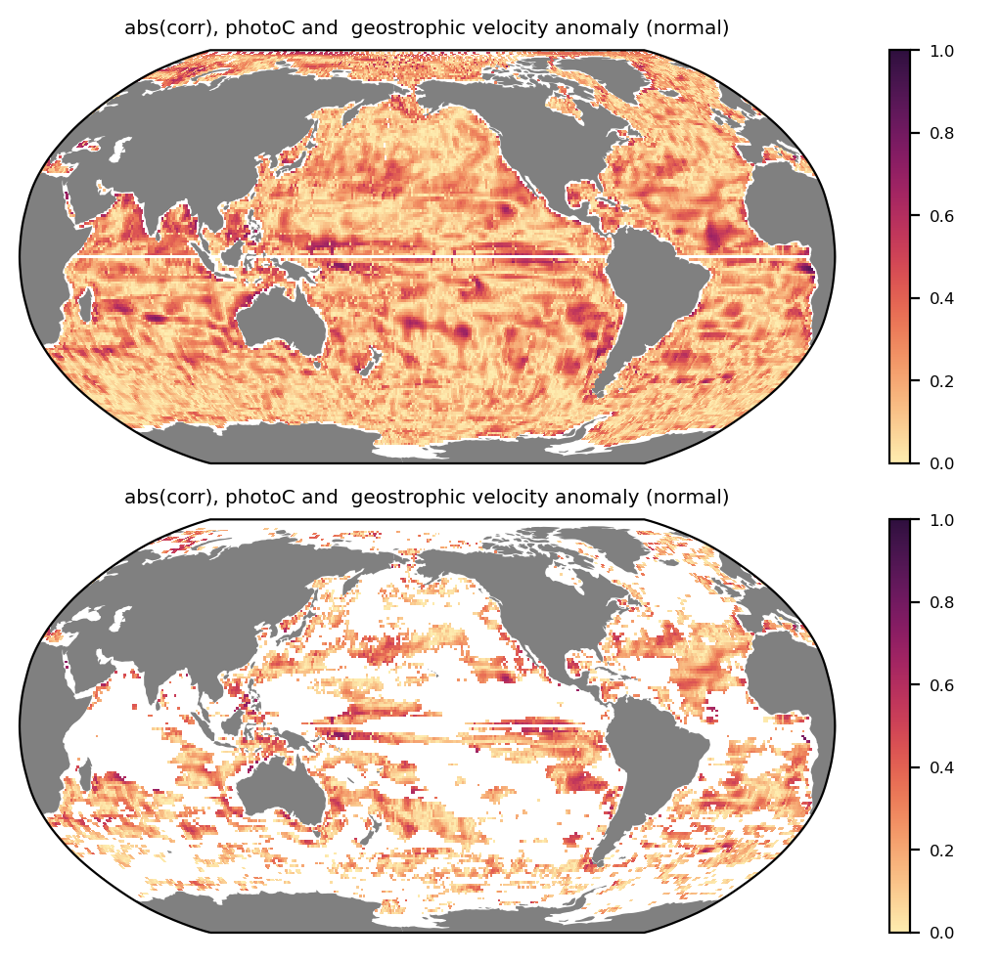

In [444]:
# corr between NPP and normal component to the climatological mean geostrophic current

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_photoC_u_anom_normal)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'geostrophic velocity anomaly (normal)')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_u_anom_normal)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'geostrophic velocity anomaly (normal)')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')




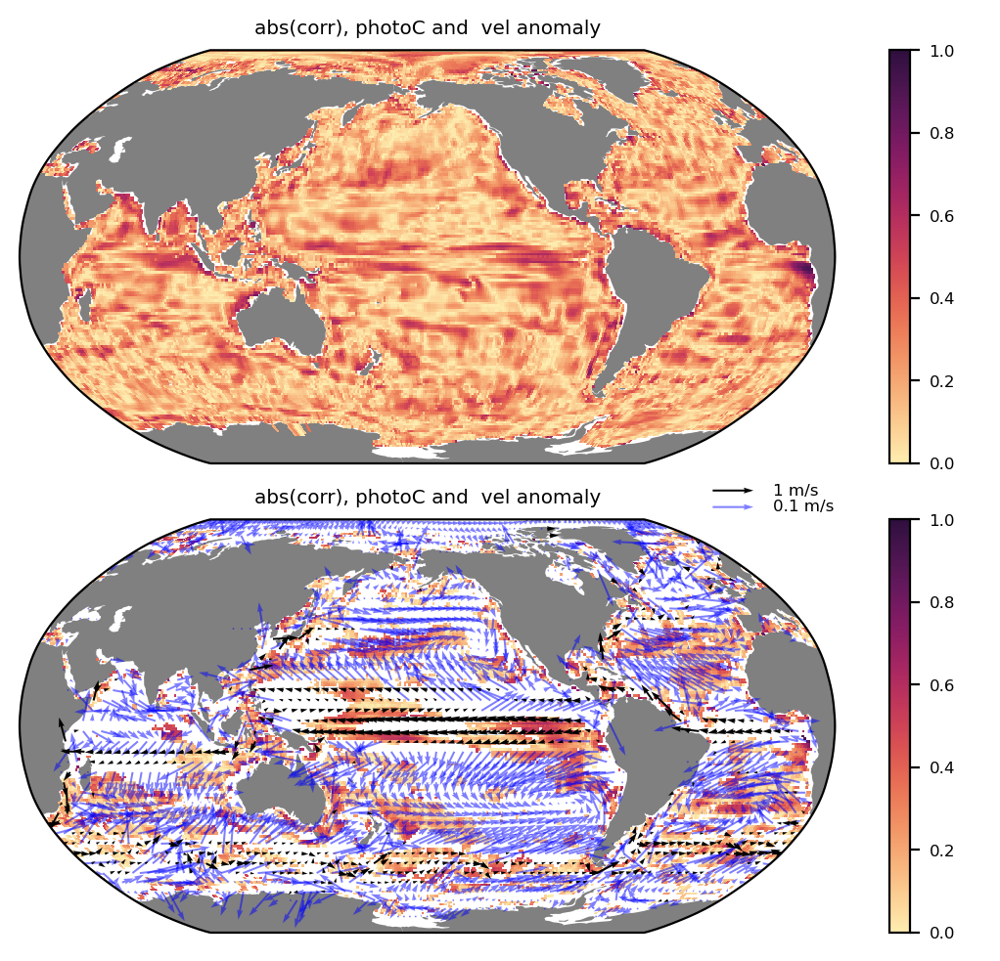

In [391]:
# corr between NPP and normal component to the climatological mean geostrophic current

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_photoC_u_anom_clim_raw)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'vel anomaly')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_u_anom_clim_raw)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'vel anomaly')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')


lat = cfg_var_UVEL.ODA_ds['lat'].values
lon = cfg_var_VVEL.ODA_ds['lon'].values
lon2d, lat2d = np.meshgrid(lon, lat)

speed=np.sqrt((cfg_var_UVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100)**2 + (cfg_var_VVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0)/100)**2)

U = cfg_var_UVEL.ODA_ds.where(speed<0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values/100  # shape (lat, lon)
V = cfg_var_VVEL.ODA_ds.where(speed<0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values/100  # shape (lat, lon)

aval=0.5
qvint = 4

q = axes[1].quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U[::qvint, ::qvint], V[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=2,       # adjust to control arrow size. large scale = small arrow
    color='blue',      # or use 'C0' or a colormap
    alpha=aval
)

axes[1].quiverkey(q, 0.9, 1.03, 0.1, '0.1 m/s', labelpos='E', alpha=aval)

U2 = cfg_var_UVEL.ODA_ds.where(speed>=0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values/100  # shape (lat, lon)
V2 = cfg_var_VVEL.ODA_ds.where(speed>=0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values/100  # shape (lat, lon)

q2 = axes[1].quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U2[::qvint, ::qvint], V2[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=20,       # adjust to control arrow size. large scale = small arrow
    color='black',      # or use 'C0' or a colormap
)
axes[1].quiverkey(q2, 0.9, 1.07, 1, '1 m/s', labelpos='E', alpha=1)

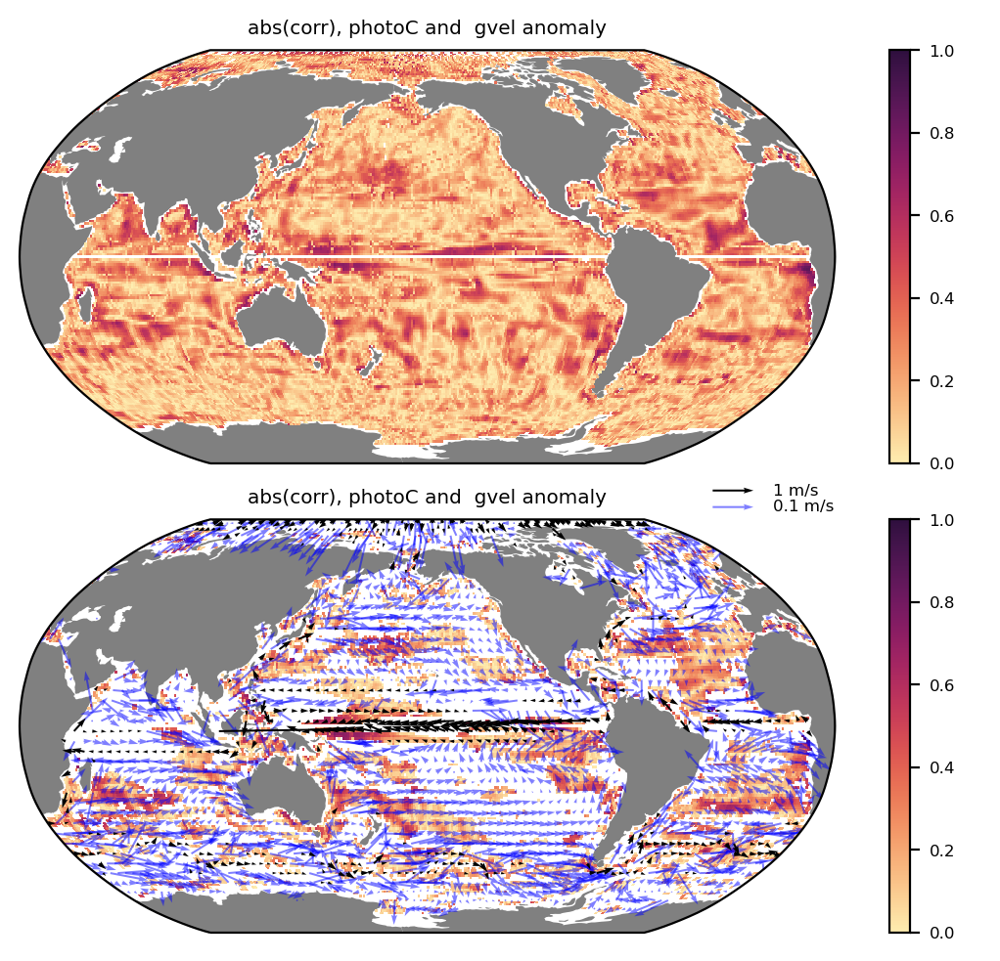

In [374]:
# corr between NPP and normal component to the climatological mean geostrophic current

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = cmocean.cm.matter

data_array = np.abs(corr_photoC_u_anom_clim)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'gvel anomaly')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_u_anom_clim)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'gvel anomaly')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')


lat = u_g['lat'].values
lon = v_g['lon'].values
lon2d, lat2d = np.meshgrid(lon, lat)

speed=np.sqrt(u_g.mean(dim='time').isel(ens_ODA=0)**2 + v_g.mean(dim='time').isel(ens_ODA=0)**2)

# U = u_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
# V = v_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
U = u_g.where(speed<0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
V = v_g.where(speed<0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
aval=0.5

qvint = 4

q = axes[1].quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U[::qvint, ::qvint], V[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=2,       # adjust to control arrow size. large scale = small arrow
    color='blue',      # or use 'C0' or a colormap
    alpha=aval
)

axes[1].quiverkey(q, 0.9, 1.03, 0.1, '0.1 m/s', labelpos='E', alpha=aval)

U2 = u_g.where(speed>=0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
V2 = v_g.where(speed>=0.1, np.nan).mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
q2 = axes[1].quiver(
    lon2d[::qvint, ::qvint], lat2d[::qvint, ::qvint], U2[::qvint, ::qvint], V2[::qvint, ::qvint],
    transform=ccrs.PlateCarree(),
    scale=20,       # adjust to control arrow size. large scale = small arrow
    color='black',      # or use 'C0' or a colormap
    alpha=1
)
axes[1].quiverkey(q2, 0.9, 1.07, 1, '1 m/s', labelpos='E', alpha=1)

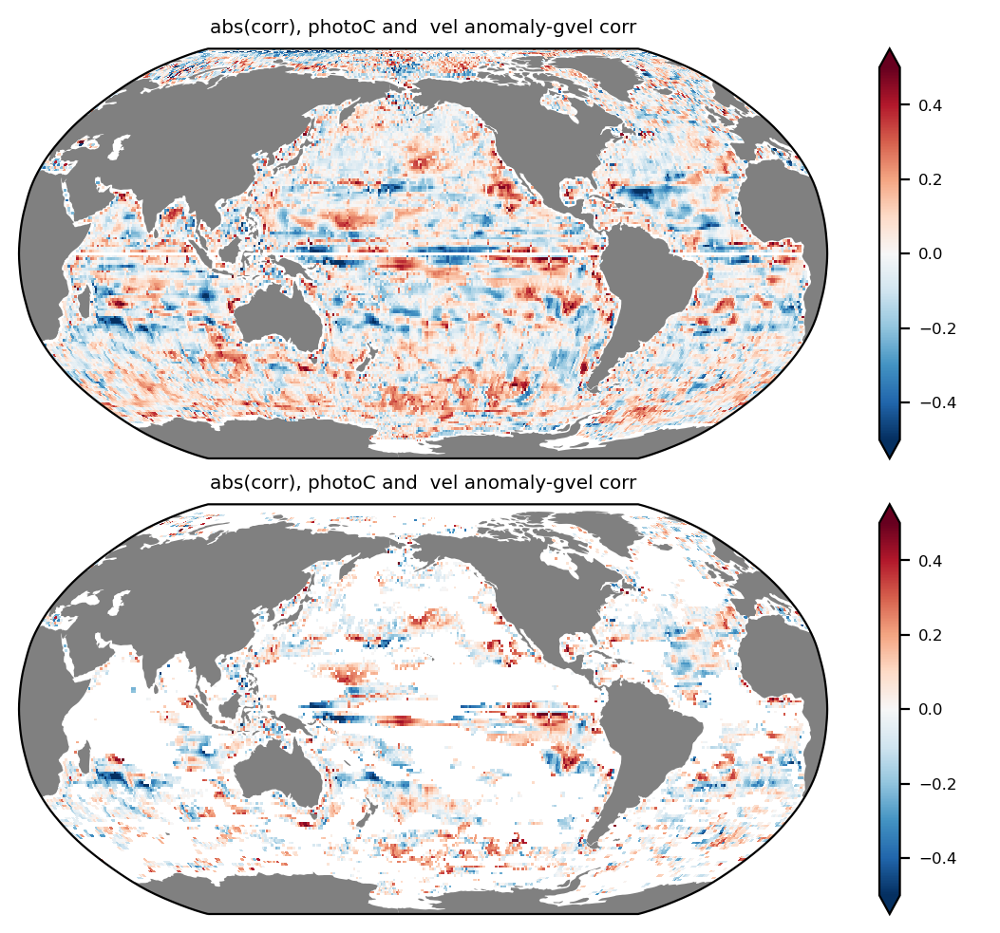

In [443]:
# corr between NPP and normal component to the climatological mean geostrophic current

HCST_data_array_masked2 = HCST_data_array_masked.isel(nlat=0, nlon=0, drop=True)
HCST_data_array_masked2

mask_ODA['TLONG']=ds_grid.TLONG
mask_ODA['TLAT']=ds_grid.TLAT
mask_ODA_rgd=mask_ODA.utils.regrid()
# HCST_data_array_masked = data_array.where(mask_ODA)

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=2, ncols=1, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

cmap2 = plt.get_cmap('RdBu_r')

data_array = np.abs(corr_photoC_u_anom_clim_raw) - np.abs(corr_photoC_u_anom_clim)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=-0.5, vmax=0.5,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0].set_title('abs(corr), photoC and  ' + 'vel anomaly' + '-gvel corr')
axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

data_array = np.abs(corr_photoC_u_anom_clim_raw) - np.abs(corr_photoC_u_anom_clim)
plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, vmin=-0.5, vmax=0.5,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1].set_title('abs(corr), photoC and  ' + 'vel anomaly' + '-gvel corr')
axes[1].add_feature(land_feature, facecolor='gray', edgecolor='none')



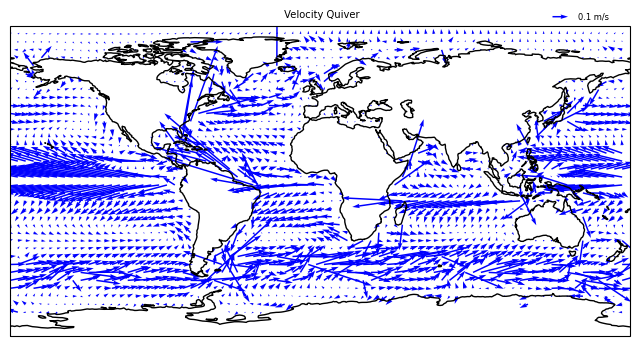

In [341]:
# Suppose u_v, g_v have dims (lat, lon),
# or (time, lat, lon) and you already selected a single time step
# e.g. u_v = u_v.isel(time=0), etc.

# 1) Pull out lat/lon as 1D arrays
lat = u_g['lat'].values
lon = v_g['lon'].values

# 2) Make a 2D mesh of coordinates
lon2d, lat2d = np.meshgrid(lon, lat)

# 3) Convert velocity components to NumPy arrays
# U = u_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
# V = v_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)

# U = cfg_var_UVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0).values /100  # shape (lat, lon)
# V = cfg_var_VVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0).values /100 # shape (lat, lon)


# 4) Create a Cartopy plot
fig, ax = plt.subplots(
    subplot_kw={"projection": ccrs.PlateCarree()},
    figsize=(8, 6)
)

# Optional: Add coastlines or other features
ax.coastlines()

# U2 = cfg_var_UVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0) /100  # shape (lat, lon)
# V2 = cfg_var_VVEL.ODA_ds.mean(dim='time').isel(ens_ODA=0) /100 # shape (lat, lon)

# speed=np.sqrt(U2**2 + V2**2)

# speed.plot.pcolormesh()

# 5) Quiver plot
q = ax.quiver(
    lon2d[::1, ::1], lat2d[::1, ::1], U[::1, ::1], V[::1, ::1],
    transform=ccrs.PlateCarree(),
    scale=4,       # adjust to control arrow size. large scale = small arrow
    regrid_shape=40,  # optional to downsample vectors
    color='blue'      # or use 'C0' or a colormap
)

# Add a key (legend) for vector magnitude
ax.quiverkey(q, 0.9, 1.03, 0.1, '0.1 m/s', labelpos='E')

ax.set_title(" Velocity Quiver")
plt.show()

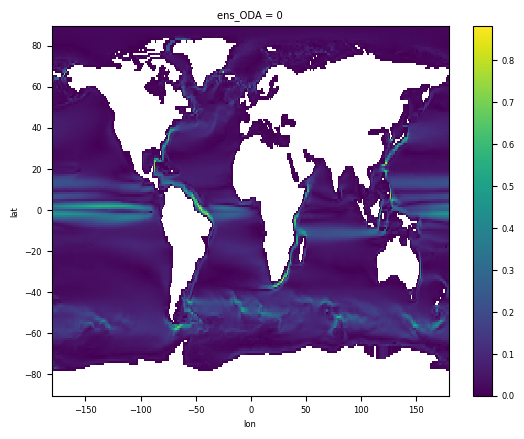

In [306]:
# Suppose u_v, g_v have dims (lat, lon),
# or (time, lat, lon) and you already selected a single time step
# e.g. u_v = u_v.isel(time=0), etc.

# 1) Pull out lat/lon as 1D arrays
lat = u_g['lat'].values
lon = v_g['lon'].values

# 2) Make a 2D mesh of coordinates
lon2d, lat2d = np.meshgrid(lon, lat)

# 3) Convert velocity components to NumPy arrays
# U = u_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)
# V = v_g.mean(dim='time').isel(ens_ODA=0).values  # shape (lat, lon)



# projection = ccrs.Robinson(central_longitude=200)
# fig, axes = plt.subplots(nrows=2, ncols=1, 
#              dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

# cmap2 = cmocean.cm.matter

# data_array = np.abs(corr_photoC_u_anom_clim)
# # plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
# #                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
# #                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})
# plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})

# axes[0].set_title('abs(corr), photoC and  ' + 'critical v(NO3)')
# axes[0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# data_array = np.abs(corr_photoC_u_anom_clim)
# plt1=data_array.where(mask_ODA_rgd, np.nan).plot.pcolormesh(x='lon', y='lat', ax=axes[1], transform=ccrs.PlateCarree(), 
#                                  cmap= cmap2, add_colorbar=True, vmin=0, vmax=1,
#                                 cbar_kwargs={"label": " ", 'spacing': 'proportional'})


elasped time for plotting Vels : 33.805781841278076


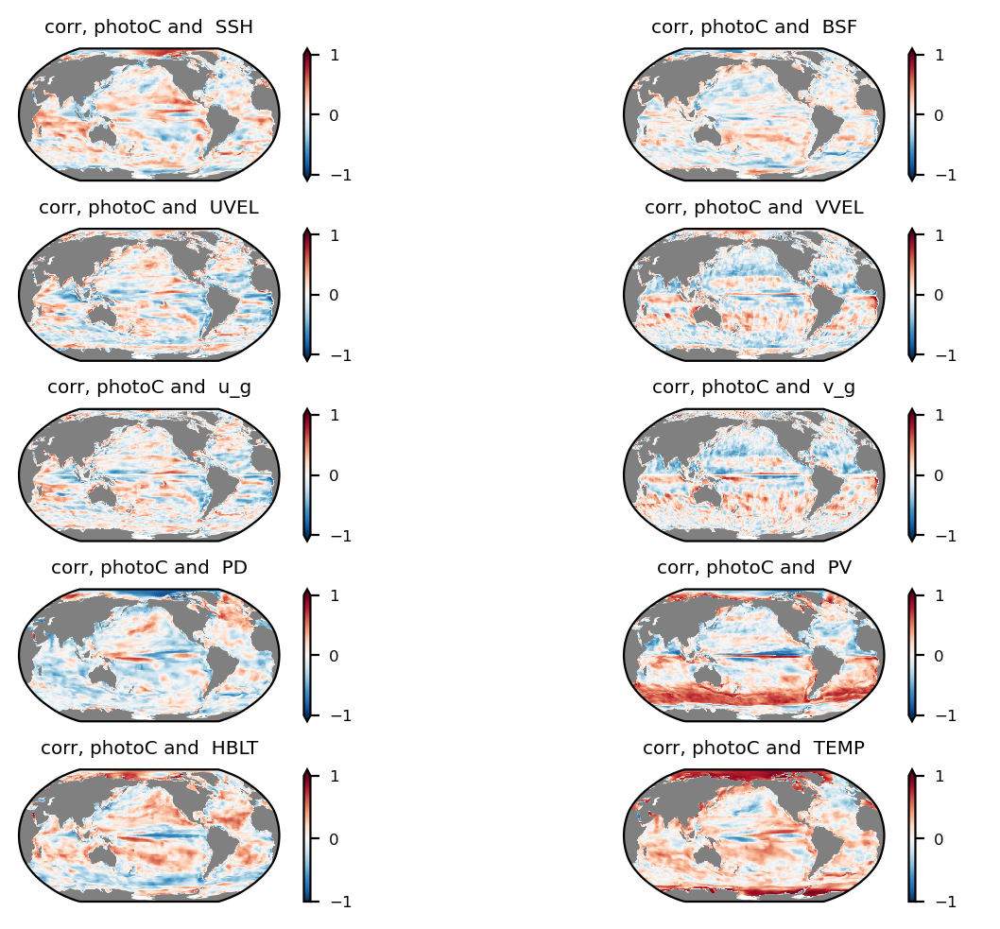

In [79]:
# clim mean

start_time = time.time()

# cmap = 'inferno'
# cmap=cmocean.cm.matter # good appearance
# cmap=cmocean.cm.haline  # good appearance
cmap = plt.get_cmap('nipy_spectral')
cmap2 = plt.get_cmap('RdBu_r')

# cfg_var_UVEL.ODA_ds
# cfg_var_VVEL.ODA_ds
# cfg_var_BSF.ODA_ds
# cfg_var_SSH.ODA_ds
# cfg_var_PD.ODA_ds
# cfg_var_PV.ODA_ds


levels = np.linspace(0,0.8,9)
ticklevels = np.linspace(0,0.8,5)
land_feature = cfeature.LAND.with_scale('110m')

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=5, ncols=2, 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

# SSH
data_array=corr_photoC_SSH
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both', vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,0].set_title('corr, photoC and  ' + cfg_var_SSH.var)
axes[0,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# BSF
data_array=corr_photoC_BSF
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both', vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,1].set_title('corr, photoC and  ' + cfg_var_BSF.var)
axes[0,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# UVEL
data_array=corr_photoC_UVEL
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,0].set_title('corr, photoC and  ' + cfg_var_UVEL.var)
axes[1,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# VVEL
data_array=corr_photoC_VVEL
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,1].set_title('corr, photoC and  ' + cfg_var_VVEL.var)
axes[1,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# u_g
data_array=corr_photoC_u_g
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,0].set_title('corr, photoC and  ' + 'u_g')
axes[2,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# v_g
data_array=corr_photoC_v_g
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,1].set_title('corr, photoC and  ' + 'v_g')
axes[2,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PD
data_array=corr_photoC_PD
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,0].set_title('corr, photoC and  ' + cfg_var_PD.var)
axes[3,0].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PV
data_array=corr_photoC_PV
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,1].set_title('corr, photoC and  ' + cfg_var_PV.var)
axes[3,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# HBLT
data_array=corr_photoC_HBLT
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,0].set_title('corr, photoC and  ' + cfg_var_HBLT.var)
axes[4,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# TEMP
data_array=corr_photoC_TEMP
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max',  vmin=-1, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,1].set_title('corr, photoC and  ' + cfg_var_TEMP.var)
axes[4,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

plt.rcParams.update({'font.size': 6})

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plotting Vels : ' + str(elapsed_time))

elasped time for plotting Vels : 32.89329934120178


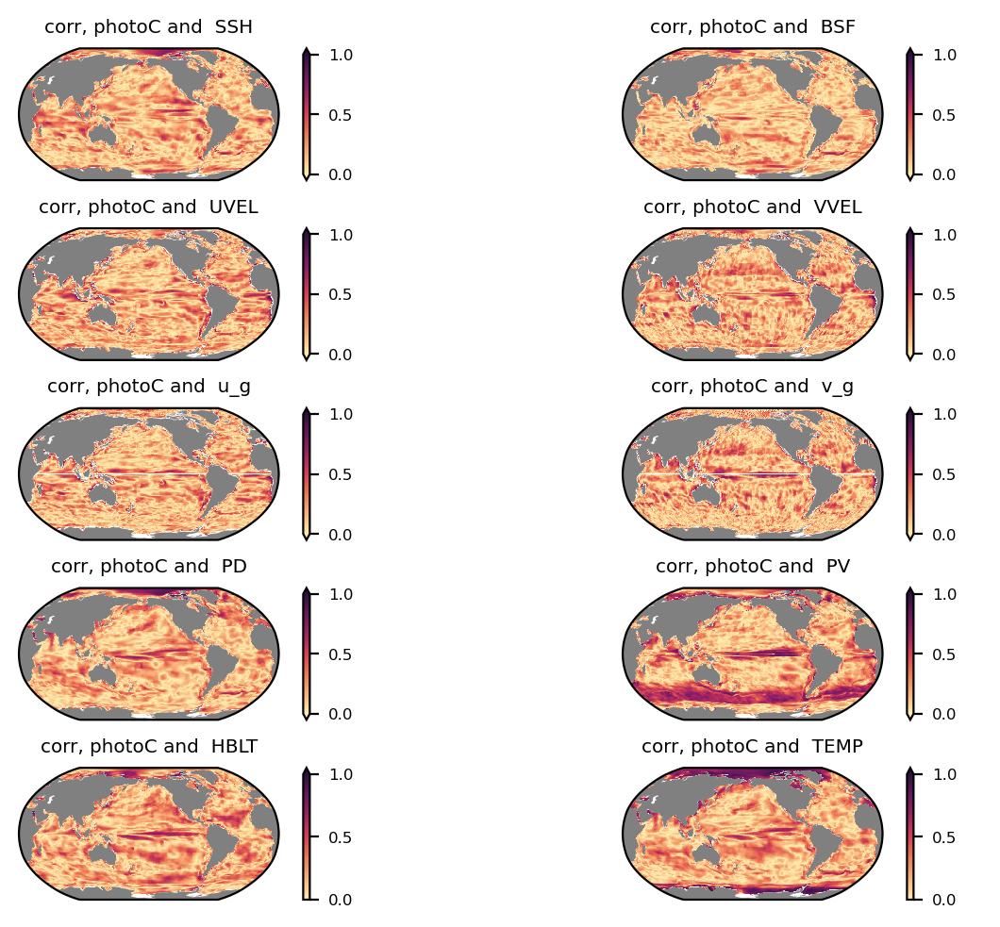

In [143]:
# clim mean

start_time = time.time()

# cmap = 'inferno'
cmap2=cmocean.cm.matter # good appearance
# cmap=cmocean.cm.haline  # good appearance
# cmap = plt.get_cmap('nipy_spectral')
# cmap2 = plt.get_cmap('RdBu_r')

# cfg_var_UVEL.ODA_ds
# cfg_var_VVEL.ODA_ds
# cfg_var_BSF.ODA_ds
# cfg_var_SSH.ODA_ds
# cfg_var_PD.ODA_ds
# cfg_var_PV.ODA_ds


levels = np.linspace(0,0.8,9)
ticklevels = np.linspace(0,0.8,5)
land_feature = cfeature.LAND.with_scale('110m')

# figsize=(20, 10),

projection = ccrs.Robinson(central_longitude=200)
fig, axes = plt.subplots(nrows=5, ncols=2,  
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=True)

# SSH
data_array=corr_photoC_SSH
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both', vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,0].set_title('corr, photoC and  ' + cfg_var_SSH.var)
axes[0,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# BSF
data_array=corr_photoC_BSF
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[0,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both', vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[0,1].set_title('corr, photoC and  ' + cfg_var_BSF.var)
axes[0,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# UVEL
data_array=corr_photoC_UVEL
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,0].set_title('corr, photoC and  ' + cfg_var_UVEL.var)
axes[1,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# VVEL
data_array=corr_photoC_VVEL
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[1,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[1,1].set_title('corr, photoC and  ' + cfg_var_VVEL.var)
axes[1,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

# u_g
data_array=corr_photoC_u_g
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,0].set_title('corr, photoC and  ' + 'u_g')
axes[2,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# v_g
data_array=corr_photoC_v_g
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[2,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[2,1].set_title('corr, photoC and  ' + 'v_g')
axes[2,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PD
data_array=corr_photoC_PD
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,0].set_title('corr, photoC and  ' + cfg_var_PD.var)
axes[3,0].add_feature(land_feature, facecolor='gray', edgecolor='none')


# PV
data_array=corr_photoC_PV
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[3,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='both',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[3,1].set_title('corr, photoC and  ' + cfg_var_PV.var)
axes[3,1].add_feature(land_feature, facecolor='gray', edgecolor='none')


# HBLT
data_array=corr_photoC_HBLT
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,0], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,0].set_title('corr, photoC and  ' + cfg_var_HBLT.var)
axes[4,0].add_feature(land_feature, facecolor='gray', edgecolor='none')

# TEMP
data_array=corr_photoC_TEMP
data_array = np.abs(data_array)
plt1=data_array.plot.pcolormesh(x='lon', y='lat', ax=axes[4,1], transform=ccrs.PlateCarree(), 
                                 cmap= cmap2, add_colorbar=True, extend='max',  vmin=0, vmax=1,
                                cbar_kwargs={"label": " ", 'spacing': 'proportional'})

axes[4,1].set_title('corr, photoC and  ' + cfg_var_TEMP.var)
axes[4,1].add_feature(land_feature, facecolor='gray', edgecolor='none')

plt.rcParams.update({'font.size': 6})

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plotting Vels : ' + str(elapsed_time))